## Capstone Project - The Battle of Neighborhoods (Week 2)
### Applied Data Science Capstone Week 5 by IBM/Coursera

### Table of Contents

* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

> ### Introduction:Business Problem <a name="introduction"></a>

This project will aim to find an optimal location to establish Pet Cafes in **North Germany**. This report targets entrepreneurs or NGO's interested in opening a business with a 
social cause, particulary in Animal welfare.

Since Germany, in general, has an ever increasing number of pet-friendly restaurants and establishments, we will try to find locations that are nearby Animal Shelters hence making it possible for shelters to showcase their animals in the Cafes.   
The main goal is to help Animal Shelters in promoting animal adoption and fostering.We will particulary target shelters in districts where there is a bigger population and with a better accesibilty in terms of public transport.

A ranking of optimal venues will be done which will give us a better suggestion where to establish Cafes.

>### Data <a name="data"></a>

The boundaries of **North Germany** is not consistently defined. It includes German states that border on the North and Baltic Seas. This project will focus on data from the following regions: Schleswig-Holstein, Lower Saxony (including Hamburg and Bremen), and Mecklenburg-Pomerania. Based on our problem, these factors are in high consideration:
   * number of **animal shelters** in the neighborhood
   * mode of **public transport** nearby animal shelters

In this study, I decided to use districts instead of neighborhoods as a reference for the data. District or "**LandKreis** in german, is a primary admisnistrative subdivision and is better in specifying demographic boundaries. The Hanseatic States of Hamburg and Bremen, so as the cities  Kiel, Flensburg, Lübeck, and Neumünster are considered **"kreisfrei"** meaning they are an independent administrative division.

In accordance to the data sources, we will be able to extract the needed information:
   * number of Animal shelters,nearby cafes, and Transportation services will be obtained using Foursquared API 

#### Libraries

In [1]:

import requests # library to handle requests
import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import numpy as np # library to handle data in a vectorized manner
import random # library for random number generation

# libraries for displaying images
from IPython.display import Image 
from IPython.core.display import HTML 
    
# tranforming json file into a pandas dataframe library
from pandas.io.json import json_normalize

!conda install -c conda-forge folium=0.5.0 --yes
import folium # plotting library

!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim # module to convert an address into latitude and longitude values

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib as mpl
import matplotlib.pyplot as plt

import seaborn as sns

# import k-means from clustering stage
from sklearn.cluster import KMeans

print('Folium and geopy installed')
print('Libraries imported.')


Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\Mercurial\anaconda3

  added / updated specs:
    - folium=0.5.0


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    conda-4.8.5                |           py37_0         2.9 MB
    openssl-1.1.1h             |       he774522_0         4.4 MB
    ------------------------------------------------------------
                                           Total:         7.3 MB

The following packages will be UPDATED:

  conda                                        4.8.4-py37_0 --> 4.8.5-py37_0
  openssl                                 1.1.1g-he774522_1 --> 1.1.1h-he774522_0




conda-4.8.5          | 2.9 MB    |            |   0% 
conda-4.8.5          | 2.9 MB    |            |   1% 
conda-4.8.5          | 2.9 MB    | ##4        |  25% 
conda-4.8.5          | 2.9 MB    | ####8      |  49% 
conda-4.8.5   

> ##### North Germany Districts

Based from the German Statistics office website, Germany currently has a population of 83.2 million with 15.062 million coming from North Germany excluding Berlin and Brandenburg. As mentioned before, one of the criteria to be considered in ranking suitable locations for the Pet Cafe is a district with a good population density. With this in mind, let us visualize the population distribution for each district

   * For the data frame, I used data from 'suche postleitzahl' website and dropped the Land Area, and unnamed columns, leaving only the columns for “Landkreis”, Population, States ,and Postal Code(PLZ). Landkreis is the same as a District. I merged all the data from all the 3 focus states into one data-frame. I did not include name of neighborhoods as the Landkreis is more accurate for location.
   * The geospatial coordinates were gathered thru OpenDataSoft(ODS)[4] website and Google Maps 'Search Nearby' option.  ODS listed coordinates together with the postal codes for better accuracy.

In [2]:
filename2="C:/Users/Mercurial/Desktop/NGmerged.csv"
NGpop=pd.read_csv(filename2, header=None)
NGpop.reset_index(drop=True, inplace=True)
NGpop.drop([0], axis=0, inplace=True)
NGpop.head()

,0,1,2,3,4,5,6
1,21039,Börnsen,4764,Herzogtum Lauenburg,Schleswig-Holstein,53.4306,10.2678
2,21039,Escheburg,3421,Herzogtum Lauenburg,Schleswig-Holstein,53.4667,10.3167
3,21039,Kröppelshagen-Fahrendorf,1287,Herzogtum Lauenburg,Schleswig-Holstein,53.4762,10.2816
4,21465,Wentorf bei Hamburg,13349,Herzogtum Lauenburg,Schleswig-Holstein,53.4858,10.2267
5,21465,Reinbek,27649,Stormarn,Schleswig-Holstein,53.4456,10.2211


In [3]:
headers=["PostalCode","City","Population","District","Region", "Latitude", "Longitude"]
NGpop.columns=headers
NGpop.head()

,PostalCode,City,Population,District,Region,Latitude,Longitude
1,21039,Börnsen,4764,Herzogtum Lauenburg,Schleswig-Holstein,53.4306,10.2678
2,21039,Escheburg,3421,Herzogtum Lauenburg,Schleswig-Holstein,53.4667,10.3167
3,21039,Kröppelshagen-Fahrendorf,1287,Herzogtum Lauenburg,Schleswig-Holstein,53.4762,10.2816
4,21465,Wentorf bei Hamburg,13349,Herzogtum Lauenburg,Schleswig-Holstein,53.4858,10.2267
5,21465,Reinbek,27649,Stormarn,Schleswig-Holstein,53.4456,10.2211


In [4]:
NGpop[["Population", "PostalCode"]]=NGpop[["Population", "PostalCode"]].astype("int")
NGpop.dtypes

PostalCode      int32
City           object
Population      int32
District       object
Region         object
Latitude      float64
Longitude     float64
dtype: object

In [5]:
SH= NGpop[(NGpop['Region']== 'Schleswig-Holstein')]
print('Shleswig-Holstein has {} neighborhoods.'.format(SH.shape[0]))
SH.head()

Shleswig-Holstein has 1068 neighborhoods.


,PostalCode,City,Population,District,Region,Latitude,Longitude
1,21039,Börnsen,4764,Herzogtum Lauenburg,Schleswig-Holstein,53.4306,10.2678
2,21039,Escheburg,3421,Herzogtum Lauenburg,Schleswig-Holstein,53.4667,10.3167
3,21039,Kröppelshagen-Fahrendorf,1287,Herzogtum Lauenburg,Schleswig-Holstein,53.4762,10.2816
4,21465,Wentorf bei Hamburg,13349,Herzogtum Lauenburg,Schleswig-Holstein,53.4858,10.2267
5,21465,Reinbek,27649,Stormarn,Schleswig-Holstein,53.4456,10.2211


In [6]:
H= NGpop[(NGpop['Region']== 'Hamburg')]
print('Hamburg has {} neighborhoods.'.format(H.shape[0]))
H.head()

Hamburg has 7 neighborhoods.


,PostalCode,City,Population,District,Region,Latitude,Longitude
2760,5742,Hamburg-Nord,294622,Hamburg,Hamburg,53.5544,9.9946
2761,5743,Hamburg-Eimsbüttel,257064,Hamburg,Hamburg,53.5453,9.9953
2762,5744,Hamburg-Altona,253735,Hamburg,Hamburg,53.5521,10.0004
2763,5745,Hamburg-Bergedorf,121541,Hamburg,Hamburg,53.5564,10.0144
2764,5746,Hamburg-Harburg,153196,Hamburg,Hamburg,53.5439,10.0133


In [7]:
B=NGpop[(NGpop['Region']== 'Bremen')]
print('Bremen has {} neighborhoods.'.format(B.shape[0]))
B.head()

Bremen has 23 neighborhoods.


,PostalCode,City,Population,District,Region,Latitude,Longitude
2737,5129,Bremerhaven,113634,Bremerhaven,Bremen,53.5687,8.5741
2738,5130,Bremen-Häfen,147,Bremen,Bremen,53.5286,8.5907
2739,5131,Bremen-Mitte,17136,Bremen,Bremen,53.5002,8.6047
2740,5132,Bremen-Woltmershausen,13878,Bremen,Bremen,53.5299,8.6098
2741,5133,Bremen-Seehausen,1107,Bremen,Bremen,53.5545,8.5933


In [8]:
ND=NGpop[(NGpop['Region']== 'Niedersachsen')]
print('Lower Saxony has {} neighborhoods.'.format(ND.shape[0]))
ND.head()

Lower Saxony has 944 neighborhoods.


,PostalCode,City,Population,District,Region,Latitude,Longitude
1793,7153,Amt Neuhaus,5005,Lüneburg,Niedersachsen,53.4675,11.4991
1794,7154,Bleckede,9457,Lüneburg,Niedersachsen,53.5443,11.5619
1795,7155,Seevetal,41506,Harburg,Niedersachsen,53.5515,11.5093
1796,7156,Rosengarten (Landkreis Harburg),13553,Harburg,Niedersachsen,53.5535,11.6656
1797,7157,Bendestorf,2396,Harburg,Niedersachsen,53.5352,11.6106


In [9]:
MV=NGpop[(NGpop['Region']== 'Mecklenburg-Vorpommern')]
print('Mecklenburg-Vorpommern has {} neighborhoods.'.format(MV.shape[0]))
MV.head()

Mecklenburg-Vorpommern has 724 neighborhoods.


,PostalCode,City,Population,District,Region,Latitude,Longitude
1069,25923,Neubrandenburg,64086,Mecklenburgische Seenplatte,Mecklenburg-Vorpommern,53.5476,13.2555
1070,6138,Beseritz,115,Mecklenburgische Seenplatte,Mecklenburg-Vorpommern,53.5761,13.2797
1071,6139,Blankenhof,716,Mecklenburgische Seenplatte,Mecklenburg-Vorpommern,53.5537,13.2969
1072,6140,Brunn (Mecklenburg),1035,Mecklenburgische Seenplatte,Mecklenburg-Vorpommern,53.5973,13.3694
1073,6141,Neddemin,352,Mecklenburgische Seenplatte,Mecklenburg-Vorpommern,53.6084,13.2309


In [11]:
NG1=NGpop[['Population','District','Region']]
NGtotal=NG1.groupby(['District', 'Region'])['Population'].sum()
NGtotalnew=pd.DataFrame(NGtotal)
NGtotalnew.sort_values(['Population'],axis=0, ascending=False,inplace=True)
NewNG=NGtotalnew.reset_index()
NewNG.head()

,District,Region,Population
0,Hamburg,Hamburg,1779308
1,Region Hannover,Niedersachsen,1157624
2,Bremen,Bremen,546634
3,Osnabrück,Niedersachsen,522091
4,Göttingen,Niedersachsen,328074


In [222]:
path="C:/Users/Mercurial/Desktop/NewNG.xlsx"
NewNG.to_excel(path)

In [12]:
from geopy.extra.rate_limiter import RateLimiter
geolocator = Nominatim(user_agent="DE_explorer")

# 1 - convenient function to delay between geocoding calls
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)
#- New Location column
NewNG['Location']= NewNG['District'].apply(geocode)
# 3 - create longitude, latitude, altitude from location column (returns tuple)
NewNG['Point'] = NewNG['Location'].apply(lambda loc: tuple(loc.point) if loc else None)
# 4 - split point column into latitude, longitude columns
NewNG[['Latitude', 'Longitude', 'Altitude']] = pd.DataFrame(NewNG['Point'].tolist(), index=NewNG.index)
NewNG.head()

,District,Region,Population,Location,Point,Latitude,Longitude,Altitude
0,Hamburg,Hamburg,1779308,"(Hamburg, Deutschland, (53.5437641, 10.0099133))","(53.5437641, 10.0099133, 0.0)",53.543764,10.009913,0.0
1,Region Hannover,Niedersachsen,1157624,"(Region Hannover, Niedersachsen, Deutschland, ...","(52.4026852, 9.801197840611401, 0.0)",52.402685,9.801198,0.0
2,Bremen,Bremen,546634,"(Bremen, Deutschland, (53.0758196, 8.8071646))","(53.0758196, 8.8071646, 0.0)",53.075820,8.807165,0.0
3,Osnabrück,Niedersachsen,522091,"(Osnabrück, Niedersachsen, Deutschland, (52.26...","(52.266837, 8.049741, 0.0)",52.266837,8.049741,0.0
4,Göttingen,Niedersachsen,328074,"(Göttingen, Landkreis Göttingen, Niedersachsen...","(51.5327604, 9.9352051, 0.0)",51.532760,9.935205,0.0


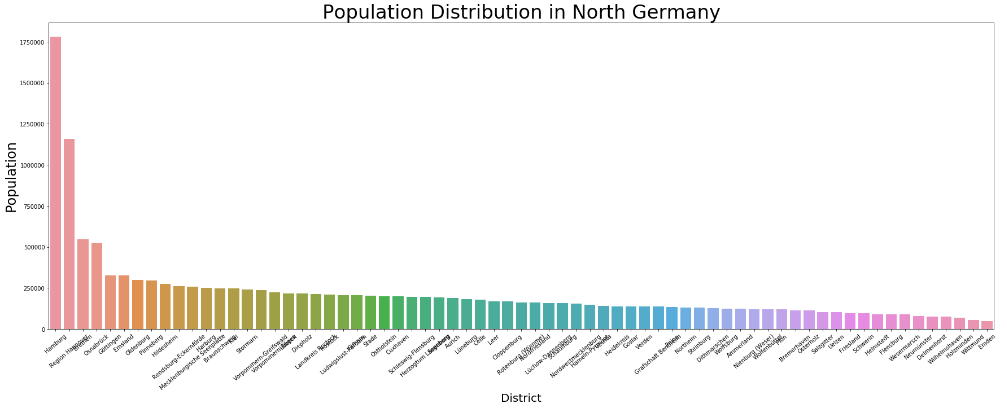

In [240]:
fig = plt.figure(figsize=(30,10))
bar = sns.barplot(x="District", y="Population", data=NewNG)

bar.set_ylabel("Population", fontsize=24)
bar.set_xlabel("District", fontsize=20)
bar.set_xticklabels(bar.get_xticklabels(),rotation=40)
bar.set_title("Population Distribution in North Germany", fontsize=34)
plt.show()

Based on the data we have above, we can already infer which districts we can focus on evidenced by its population. The top 10 Districts with a big population density are as follows:
  * Hamburg                                           
  * Hannover (Niedersachsen)                                        
  * Bremen                                    
  * Osnabrück (Niedersachsen)                            
  * Göttingen (Niedersachsen)
  * Elmsland  (Niedersachsen)
  * Oldenberg (Niedersachsen)
  * Pinneberg (Schleswig-Holstein)
  * Rendsburg-Eckernförde (Schleswig-Holstein)
  * Hildesheim Niedersachsen

As you may notice, most of the populated District are in Lower Saxony (Niedersachsen) and the top 10 areas does not equally represent the 5 states that we selected. However, we can take 3 Districts from each state with a good population distribution (excluding Hamburg and Bremen as they are a state by themselves) to represent all the states to have a candidate location for each state. In order to do so, we can go back to the previous data for each individual states.

In [13]:
SH1=SH[['Population','District','Region']]
SHnew=SH1.groupby(['District', 'Region'])['Population'].sum()
SHtotalnew=pd.DataFrame(SHnew)
SHtotalnew.sort_values(['Population'],axis=0, ascending=False,inplace=True)
NewSH=SHtotalnew.reset_index()
NewSH.head()

,District,Region,Population
0,Pinneberg,Schleswig-Holstein,295323
1,Rendsburg-Eckernförde,Schleswig-Holstein,262175
2,Kiel,Schleswig-Holstein,247548
3,Stormarn,Schleswig-Holstein,241463
4,Lübeck,Schleswig-Holstein,217198


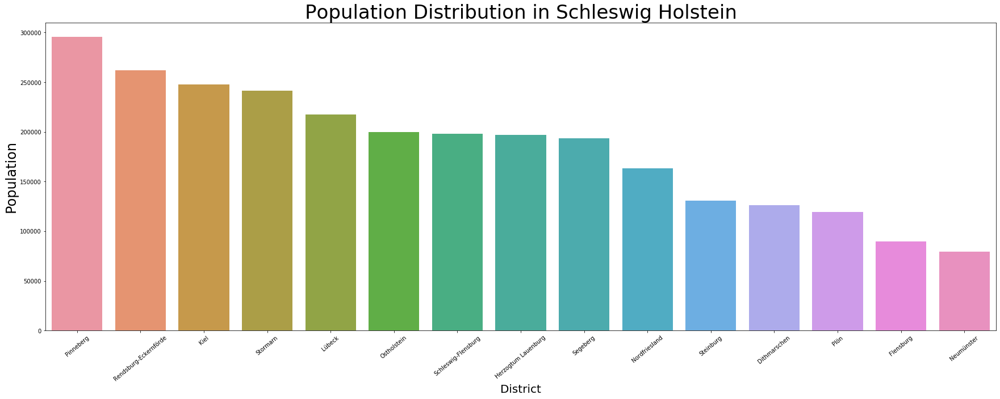

In [242]:
fig = plt.figure(figsize=(30,10))
bar = sns.barplot(x="District", y="Population", data=NewSH)

bar.set_ylabel("Population", fontsize=24)
bar.set_xlabel("District", fontsize=20)
bar.set_xticklabels(bar.get_xticklabels(),rotation=40)
bar.set_title("Population Distribution in Schleswig Holstein", fontsize=34)
plt.show()

In [14]:
ND1=ND[['Population','District','Region']]
NDnew=ND1.groupby(['District', 'Region'])['Population'].sum()
NDtotalnew=pd.DataFrame(NDnew)
NDtotalnew.sort_values(['Population'],axis=0, ascending=False,inplace=True)
NewND=NDtotalnew.reset_index()
NewND.head()

,District,Region,Population
0,Region Hannover,Niedersachsen,1157624
1,Osnabrück,Niedersachsen,522091
2,Göttingen,Niedersachsen,328074
3,Emsland,Niedersachsen,325657
4,Oldenburg,Niedersachsen,298354


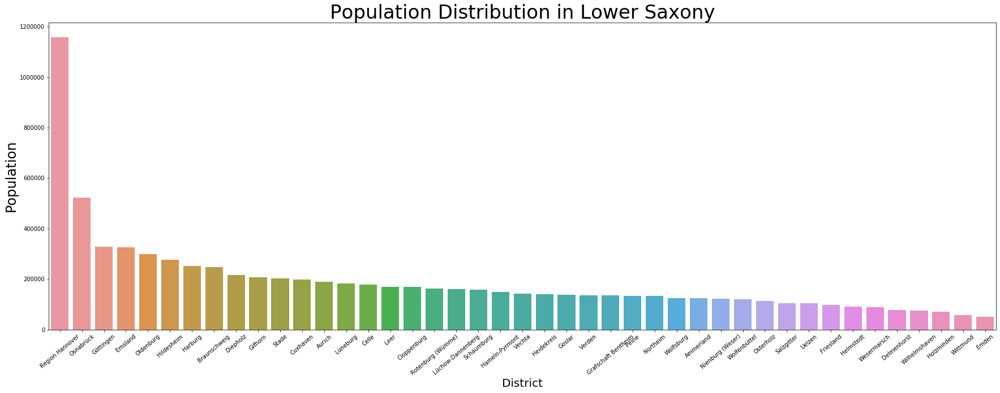

In [244]:
fig = plt.figure(figsize=(30,10))
bar = sns.barplot(x="District", y="Population", data=NewND)

bar.set_ylabel("Population", fontsize=24)
bar.set_xlabel("District", fontsize=20)
bar.set_xticklabels(bar.get_xticklabels(),rotation=40)
bar.set_title("Population Distribution in Lower Saxony", fontsize=34)
plt.show()

In [15]:
MV1=MV[['Population','District','Region']]
MVnew=MV1.groupby(['District', 'Region'])['Population'].sum()
MVtotalnew=pd.DataFrame(MVnew)
MVtotalnew.sort_values(['Population'],axis=0, ascending=False,inplace=True)
NewMV=MVtotalnew.reset_index()
NewMV.head()

,District,Region,Population
0,Mecklenburgische Seenplatte,Mecklenburg-Vorpommern,259130
1,Vorpommern-Greifswald,Mecklenburg-Vorpommern,236697
2,Vorpommern-Rügen,Mecklenburg-Vorpommern,224684
3,Landkreis Rostock,Mecklenburg-Vorpommern,215113
4,Rostock,Mecklenburg-Vorpommern,208886


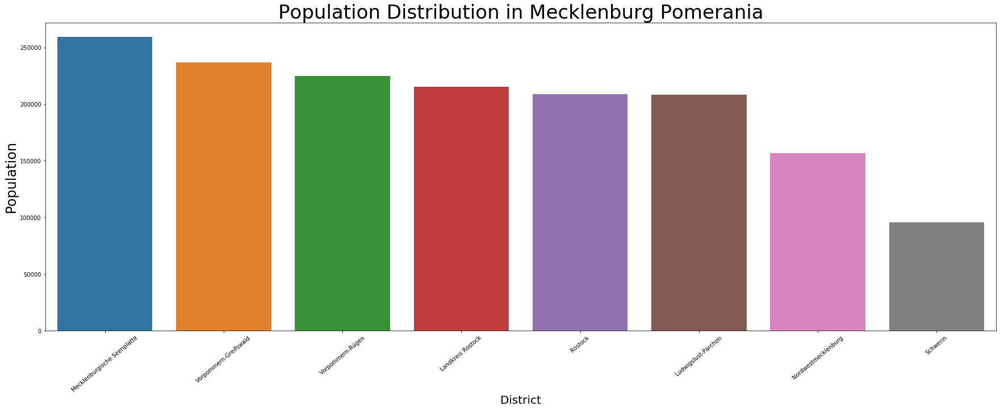

In [246]:
fig = plt.figure(figsize=(30,10))
bar = sns.barplot(x="District", y="Population", data=NewMV)

bar.set_ylabel("Population", fontsize=24)
bar.set_xlabel("District", fontsize=20)
bar.set_xticklabels(bar.get_xticklabels(),rotation=40)
bar.set_title("Population Distribution in Mecklenburg Pomerania", fontsize=34)
plt.show()

> #### Geographical Coordinates of Regions in North Germany

Using geopy, we extract the coordinates for each selected region. 

As the borders for North Germany are not well defined,the spatial coordinates would vary depending on which border is considered. For example; as a whole Berlin, Brandenburg, Saxony Anhalt, and Nord-Rhein Westphalia are part of Northern Germany in terms of spatial coordinates, with Berlin as center. However, during the second half of the 20th century, a cultural division of northern Germany into an Eastern and a Western part has become more pronounced due to the 1949–1990 division of all of Germany into West Germany and East Germany, where identities based upon the former Iron Curtain and mutual prejudices regarding what once was the other side may still persist today.

With the new data above, we can chose the top Districts. The list is as follows
  * Hamburg                                           
  * Bremen                                                                           
  * Hannover (Niedersachsen)                            
  * Osnabrück (Niedersachsen) 
  * Göttingen (Niedersachsen)
  * Mecklenburgische Seenplatte (Mecklenburg-Vorpommern)
  * Vorpommern-Greifswald (Mecklenburg-Vorpommern)
  * Landkreis Rostock (Mecklenburg-Vorpommern)
  * Pinneberg (Schleswig-Holstein)
  * Rendsburg-Eckernförde (Schleswig-Hosltein)
  * Kiel (Schleswig-Holstein)


In [16]:
address = 'Schleswig-Holstein'

geolocator = Nominatim(user_agent="DE_explorer")
location = geolocator.geocode(address)
latitude_SH = location.latitude
longitude_SH = location.longitude
print('The geograpical coordinate of Schleswig-Holstein are {}, {}.'.format(latitude_SH, longitude_SH))

The geograpical coordinate of Schleswig-Holstein are 54.1853998, 9.8220089.


In [17]:
address = 'Hamburg'

geolocator = Nominatim(user_agent="DE_explorer")
location = geolocator.geocode(address)
latitude_H = location.latitude
longitude_H = location.longitude
print('The geograpical coordinate of Hamburg are {}, {}.'.format(latitude_H, longitude_H))

The geograpical coordinate of Hamburg are 53.5437641, 10.0099133.


In [18]:
address = 'Bremen'

geolocator = Nominatim(user_agent="DE_explorer")
location = geolocator.geocode(address)
latitude_B = location.latitude
longitude_B = location.longitude
print('The geograpical coordinate of Bremen are {}, {}.'.format(latitude_B, longitude_B))

The geograpical coordinate of Bremen are 53.0758196, 8.8071646.


In [19]:
address = 'Niedersachsen'

geolocator = Nominatim(user_agent="DE_explorer")
location = geolocator.geocode(address)
latitude_N = location.latitude
longitude_N = location.longitude
print('The geograpical coordinate of Niedersachsen are {}, {}.'.format(latitude_N, longitude_N))

The geograpical coordinate of Niedersachsen are 52.8398531, 9.075962.


In [20]:
address = 'Schleswig'

geolocator = Nominatim(user_agent="DE_explorer")
location = geolocator.geocode(address)
latitude_S = location.latitude
longitude_S = location.longitude
print('The geograpical coordinate of Schleswig are {}, {}.'.format(latitude_S, longitude_S))

The geograpical coordinate of Schleswig are 54.51851, 9.5653284.


In [21]:
address = 'Mecklenberg-Vorpommern'

geolocator = Nominatim(user_agent="DE_explorer")
location = geolocator.geocode(address)
latitude_MV = location.latitude
longitude_MV = location.longitude
print('The geograpical coordinate of Mecklenberg-Vorpommern are {}, {}.'.format(latitude_MV, longitude_MV))

The geograpical coordinate of Mecklenberg-Vorpommern are 53.7735234, 12.5755746.


> #### Let us visualize where are the Districts thru Folium

In [22]:
location=[54.2194,9.8451]

DE_geo = folium.Map (location=location, zoom_start=7, tiles='cartoDBpositron')


In [23]:
pop = folium.map.FeatureGroup()

for lat, lng, District in zip(NewNG.Latitude, NewNG.Longitude,NewNG.District):
    label='{}'.format(District)
    label=folium.Popup(label,parse_html=True)
    folium.CircleMarker(
            [lat, lng],
            radius=4,
            popup=label,
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6,
            parse_html=False
        ).add_to(DE_geo)
    

# add incidents to map
DE_geo.add_child(pop)


> ### Foursquare

In [24]:
CLIENT_ID = 'DWNFSRIEKVN23G0IPQ1L0UZ0K1CYPQ53MBYPJEZGDQC4DGDY' 
CLIENT_SECRET = '5QOWXSGE03DOCY4G5HAXRAJEDSIST2PBOLGZMDFYQYPY0BBR'
VERSION = '20200820' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: DWNFSRIEKVN23G0IPQ1L0UZ0K1CYPQ53MBYPJEZGDQC4DGDY
CLIENT_SECRET:5QOWXSGE03DOCY4G5HAXRAJEDSIST2PBOLGZMDFYQYPY0BBR


> Now that we have the coordinates for each region, we can now extract a list of Animal shelters.
Our interest will be on the "Professional and other Places" category, particulary with Animal shelters.

In [25]:
LIMIT = 100 # limit of number of venues returned by Foursquare API (Maximum 50 resposes)
search_query = 'Tierheim', 'Tierschutz'
radius =50000000000 # define radius
category='4e52d2d203646f7c19daa8ae' # Animal Shelter

# create URL
url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&query={}&categoryId={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    search_query,
    category,
    latitude_SH, 
    longitude_SH,
    radius, 
    LIMIT)

url # display URL

"https://api.foursquare.com/v2/venues/search?&client_id=DWNFSRIEKVN23G0IPQ1L0UZ0K1CYPQ53MBYPJEZGDQC4DGDY&client_secret=5QOWXSGE03DOCY4G5HAXRAJEDSIST2PBOLGZMDFYQYPY0BBR&v=20200820&query=('Tierheim', 'Tierschutz')&categoryId=4e52d2d203646f7c19daa8ae&ll=54.1853998,9.8220089&radius=50000000000&limit=100"

In [26]:
# get request for results
results = requests.get(url).json()
results   # display results

{'meta': {'code': 200, 'requestId': '5f6b41961347ca2cfb006ffb'},
 'response': {'venues': [{'id': '592fe0f80a464d423f164f31',
    'name': 'Tierheim Wasbek',
    'location': {'address': 'Krusenhofer Weg 111',
     'lat': 54.08494,
     'lng': 9.93342000000007,
     'labeledLatLngs': [{'label': 'display',
       'lat': 54.08494,
       'lng': 9.93342000000007}],
     'distance': 13336,
     'postalCode': '24647',
     'cc': 'DE',
     'city': 'Wasbek',
     'state': 'Schleswig-Holstein',
     'country': 'Deutschland',
     'formattedAddress': ['Krusenhofer Weg 111',
      '24647 Wasbek',
      'Deutschland']},
    'categories': [{'id': '4e52d2d203646f7c19daa8ae',
      'name': 'Animal Shelter',
      'pluralName': 'Animal Shelters',
      'shortName': 'Animal Shelter',
      'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/animalshelter_',
       'suffix': '.png'},
      'primary': True}],
    'referralId': 'v-1600864662',
    'hasPerk': False},
   {'id': '5d2358e91feae

In [27]:

# assign relevant part of JSON to venues
venues = results['response']['venues']

# tranform venues into a dataframe
df_SHH = json_normalize(venues)
df_SHH

C:\Users\Mercurial\anaconda3\lib\site-packages\ipykernel_launcher.py:5: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  """


,id,name,categories,referralId,hasPerk,location.address,location.lat,location.lng,location.labeledLatLngs,location.distance,location.postalCode,location.cc,location.city,location.state,location.country,location.formattedAddress,venuePage.id
0,592fe0f80a464d423f164f31,Tierheim Wasbek,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864662,False,Krusenhofer Weg 111,54.084940,9.933420,"[{'label': 'display', 'lat': 54.08494, 'lng': ...",13336,24647,DE,Wasbek,Schleswig-Holstein,Deutschland,"[Krusenhofer Weg 111, 24647 Wasbek, Deutschland]",NaN
1,5d2358e91feae30023eda5c2,Tierheim Elmshorn,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864662,False,NaN,53.775885,9.655183,"[{'label': 'display', 'lat': 53.775885, 'lng':...",46876,NaN,DE,NaN,NaN,Deutschland,[Deutschland],NaN
2,59e70264018cbb269fdd187e,Tierheim Eutin,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864662,False,Diekstauen 5,54.148230,10.599702,"[{'label': 'display', 'lat': 54.14823, 'lng': ...",50849,NaN,DE,NaN,NaN,Deutschland,"[Diekstauen 5, Deutschland]",NaN
3,4cb197bbeb65b1f7bee275cd,Franziskus-Tierheim,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864662,False,Lokstedter Grenzstr. 7,53.597206,9.942069,"[{'label': 'display', 'lat': 53.59720649475877...",65948,22527,DE,Hamburg,Hamburg,Deutschland,"[Lokstedter Grenzstr. 7, 22527 Hamburg, Deutsc...",NaN
4,4fa3b0d8e4b09d4d443c0664,Tierheim Lübeck,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864662,False,Resebergweg 20,53.923382,10.833955,"[{'label': 'display', 'lat': 53.923382, 'lng':...",72272,23569,DE,Lübeck,Schleswig-Holstein,Deutschland,"[Resebergweg 20, 23569 Lübeck, Deutschland]",NaN
5,4c6d4390e13db60c682fd8b1,Hamburger Tierschutzverein von 1841,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864662,False,Süderstraße 399,53.546099,10.066138,"[{'label': 'display', 'lat': 53.54609850935404...",72948,20537,DE,Hamburg,Hamburg,Deutschland,"[Süderstraße 399, 20537 Hamburg, Deutschland]",NaN
6,5e4564468f54b100082002d4,Tierschutzverein Hundeliebe WauWau,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864662,False,Im Schätzendorfe 37,53.212324,10.030094,"[{'label': 'display', 'lat': 53.21232373, 'lng...",109186,21272,DE,Egestorf,Niedersachsen,Deutschland,"[Im Schätzendorfe 37, 21272 Egestorf, Deutschl...",579296259


In [28]:
LIMIT = 100 # limit of number of venues returned by Foursquare API (Maximum 50 resposes)
search_query = 'Tierheim', 'Tierschutz'
radius =50000000000# define radius
category='4e52d2d203646f7c19daa8ae' # Animal Shelter

# create URL
url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&query={}&categoryId={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    search_query,
    category,
    latitude_MV, 
    longitude_MV,
    radius, 
    LIMIT)

url # display URL

"https://api.foursquare.com/v2/venues/search?&client_id=DWNFSRIEKVN23G0IPQ1L0UZ0K1CYPQ53MBYPJEZGDQC4DGDY&client_secret=5QOWXSGE03DOCY4G5HAXRAJEDSIST2PBOLGZMDFYQYPY0BBR&v=20200820&query=('Tierheim', 'Tierschutz')&categoryId=4e52d2d203646f7c19daa8ae&ll=53.7735234,12.5755746&radius=50000000000&limit=100"

In [29]:
# get request for results
results = requests.get(url).json()
results   # display results

{'meta': {'code': 200, 'requestId': '5f6b419fec09c252f3e077cb'},
 'response': {'venues': [{'id': '59fefbe1a2a6ce3c21624704',
    'name': 'Tierheim Rostock Laage',
    'location': {'address': 'Pinnower Chaussee 3',
     'lat': 53.93462,
     'lng': 12.364206,
     'labeledLatLngs': [{'label': 'display',
       'lat': 53.93462,
       'lng': 12.364206}],
     'distance': 22676,
     'postalCode': '18299',
     'cc': 'DE',
     'city': 'Laage',
     'state': 'Mecklenburg-Vorpommern',
     'country': 'Deutschland',
     'formattedAddress': ['Pinnower Chaussee 3',
      '18299 Laage',
      'Deutschland']},
    'categories': [{'id': '4e52d2d203646f7c19daa8ae',
      'name': 'Animal Shelter',
      'pluralName': 'Animal Shelters',
      'shortName': 'Animal Shelter',
      'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/animalshelter_',
       'suffix': '.png'},
      'primary': True}],
    'referralId': 'v-1600864672',
    'hasPerk': False},
   {'id': '5b13f29ba6031c002c

In [30]:
# assign relevant part of JSON to venues
venues = results['response']['venues']

# tranform venues into a dataframe
df_MV = json_normalize(venues)
df_MV

C:\Users\Mercurial\anaconda3\lib\site-packages\ipykernel_launcher.py:5: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  """


,id,name,categories,referralId,hasPerk,location.address,location.lat,location.lng,location.labeledLatLngs,location.distance,location.postalCode,location.cc,location.city,location.state,location.country,location.formattedAddress
0,59fefbe1a2a6ce3c21624704,Tierheim Rostock Laage,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864672,False,Pinnower Chaussee 3,53.934620,12.364206,"[{'label': 'display', 'lat': 53.93462, 'lng': ...",22676,18299,DE,Laage,Mecklenburg-Vorpommern,Deutschland,"[Pinnower Chaussee 3, 18299 Laage, Deutschland]"
1,5b13f29ba6031c002c0280d8,Tierheim Dorf Mecklenburg,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864672,False,NaN,53.862221,11.510797,"[{'label': 'display', 'lat': 53.862221, 'lng':...",70667,NaN,DE,Mecklenburg,Mecklenburg-Vorpommern,Deutschland,"[Dorf Mecklenburg, Deutschland]"
2,5842b9bfaf5c144c4ef2b8af,Tierheim SOS Hundehilfe Prignitz e.V.,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864672,False,Abbau Lanken 13,52.955494,11.906967,"[{'label': 'display', 'lat': 52.955494, 'lng':...",101314,19336,DE,Bad Wilsnack,Brandenburg,Deutschland,"[Abbau Lanken 13, 19336 Bad Wilsnack, Deutschl..."
3,4fa3b0d8e4b09d4d443c0664,Tierheim Lübeck,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864672,False,Resebergweg 20,53.923382,10.833955,"[{'label': 'display', 'lat': 53.923382, 'lng':...",115578,23569,DE,Lübeck,Schleswig-Holstein,Deutschland,"[Resebergweg 20, 23569 Lübeck, Deutschland]"


In [31]:
LIMIT = 100 # limit of number of venues returned by Foursquare API (Maximum 50 resposes)
search_query = 'Tierheim', 'Tierschutz'
radius =5000000000# define radius
category='4e52d2d203646f7c19daa8ae' # Animal Shelter

# create URL
url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&query={}&categoryId={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    search_query,
    category,
    latitude_S, 
    longitude_S,
    radius, 
    LIMIT)

url # display URL

"https://api.foursquare.com/v2/venues/search?&client_id=DWNFSRIEKVN23G0IPQ1L0UZ0K1CYPQ53MBYPJEZGDQC4DGDY&client_secret=5QOWXSGE03DOCY4G5HAXRAJEDSIST2PBOLGZMDFYQYPY0BBR&v=20200820&query=('Tierheim', 'Tierschutz')&categoryId=4e52d2d203646f7c19daa8ae&ll=54.51851,9.5653284&radius=5000000000&limit=100"

In [32]:
# get request for results
results = requests.get(url).json()
results   # display results

{'meta': {'code': 200, 'requestId': '5f6b41a7810e7d3e000eb1f3'},
 'response': {'venues': [{'id': '592fe0f80a464d423f164f31',
    'name': 'Tierheim Wasbek',
    'location': {'address': 'Krusenhofer Weg 111',
     'lat': 54.08494,
     'lng': 9.93342000000007,
     'labeledLatLngs': [{'label': 'display',
       'lat': 54.08494,
       'lng': 9.93342000000007}],
     'distance': 53862,
     'postalCode': '24647',
     'cc': 'DE',
     'city': 'Wasbek',
     'state': 'Schleswig-Holstein',
     'country': 'Deutschland',
     'formattedAddress': ['Krusenhofer Weg 111',
      '24647 Wasbek',
      'Deutschland']},
    'categories': [{'id': '4e52d2d203646f7c19daa8ae',
      'name': 'Animal Shelter',
      'pluralName': 'Animal Shelters',
      'shortName': 'Animal Shelter',
      'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/animalshelter_',
       'suffix': '.png'},
      'primary': True}],
    'referralId': 'v-1600864679',
    'hasPerk': False},
   {'id': '59e70264018cb

In [33]:
# assign relevant part of JSON to venues
venues = results['response']['venues']

# tranform venues into a dataframe
df_S = json_normalize(venues)
df_S

C:\Users\Mercurial\anaconda3\lib\site-packages\ipykernel_launcher.py:5: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  """


,id,name,categories,referralId,hasPerk,location.address,location.lat,location.lng,location.labeledLatLngs,location.distance,location.postalCode,location.cc,location.city,location.state,location.country,location.formattedAddress
0,592fe0f80a464d423f164f31,Tierheim Wasbek,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864679,False,Krusenhofer Weg 111,54.084940,9.933420,"[{'label': 'display', 'lat': 54.08494, 'lng': ...",53862,24647,DE,Wasbek,Schleswig-Holstein,Deutschland,"[Krusenhofer Weg 111, 24647 Wasbek, Deutschland]"
1,59e70264018cbb269fdd187e,Tierheim Eutin,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864679,False,Diekstauen 5,54.148230,10.599702,"[{'label': 'display', 'lat': 54.14823, 'lng': ...",78779,NaN,DE,NaN,NaN,Deutschland,"[Diekstauen 5, Deutschland]"
2,5d2358e91feae30023eda5c2,Tierheim Elmshorn,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864679,False,NaN,53.775885,9.655183,"[{'label': 'display', 'lat': 53.775885, 'lng':...",82875,NaN,DE,NaN,NaN,Deutschland,[Deutschland]
3,4e3e4b8645dd68e3274553c9,Tierheim Sylt,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864679,False,NaN,54.899832,8.349847,"[{'label': 'display', 'lat': 54.89983199030129...",88949,NaN,DE,Sylt,Schleswig-Holstein,Deutschland,"[Sylt, Deutschland]"
4,4cb197bbeb65b1f7bee275cd,Franziskus-Tierheim,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864679,False,Lokstedter Grenzstr. 7,53.597206,9.942069,"[{'label': 'display', 'lat': 53.59720649475877...",105470,22527,DE,Hamburg,Hamburg,Deutschland,"[Lokstedter Grenzstr. 7, 22527 Hamburg, Deutsc..."
5,4c6d4390e13db60c682fd8b1,Hamburger Tierschutzverein von 1841,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864679,False,Süderstraße 399,53.546099,10.066138,"[{'label': 'display', 'lat': 53.54609850935404...",113090,20537,DE,Hamburg,Hamburg,Deutschland,"[Süderstraße 399, 20537 Hamburg, Deutschland]"


In [34]:
LIMIT = 100 # limit of number of venues returned by Foursquare API (Maximum 50 resposes)
search_query = 'Tierheim', 'Tierschutz'
radius =500000000# define radius
category='4e52d2d203646f7c19daa8ae' # Animal Shelter

# create URL
url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&query={}&categoryId={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    search_query,
    category,
    latitude_B, 
    longitude_B,
    radius, 
    LIMIT)

url # display URL

"https://api.foursquare.com/v2/venues/search?&client_id=DWNFSRIEKVN23G0IPQ1L0UZ0K1CYPQ53MBYPJEZGDQC4DGDY&client_secret=5QOWXSGE03DOCY4G5HAXRAJEDSIST2PBOLGZMDFYQYPY0BBR&v=20200820&query=('Tierheim', 'Tierschutz')&categoryId=4e52d2d203646f7c19daa8ae&ll=53.0758196,8.8071646&radius=500000000&limit=100"

In [35]:
# get request for results
results = requests.get(url).json()
results   # display results

{'meta': {'code': 200, 'requestId': '5f6b41af9498ba3d6738e59c'},
 'response': {'venues': [{'id': '5b608cb6e17910002c718c8f',
    'name': 'Tierheim Tierschutz Nienburg „Drakenburger Heide“ e.V.',
    'location': {'address': 'Auf der Heide 1',
     'crossStreet': 'Schipse',
     'lat': 52.683813,
     'lng': 9.25376,
     'labeledLatLngs': [{'label': 'display',
       'lat': 52.683813,
       'lng': 9.25376}],
     'distance': 52956,
     'postalCode': '31582',
     'cc': 'DE',
     'city': 'Nienburg - OT Drakenburg',
     'state': 'Niedersachsen',
     'country': 'Deutschland',
     'formattedAddress': ['Auf der Heide 1 (Schipse)',
      '31582 Nienburg - OT Drakenburg',
      'Deutschland']},
    'categories': [{'id': '4e52d2d203646f7c19daa8ae',
      'name': 'Animal Shelter',
      'pluralName': 'Animal Shelters',
      'shortName': 'Animal Shelter',
      'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/animalshelter_',
       'suffix': '.png'},
      'primary': Tr

In [36]:

# assign relevant part of JSON to venues
venues = results['response']['venues']

# tranform venues into a dataframe
df_B = json_normalize(venues)
df_B

C:\Users\Mercurial\anaconda3\lib\site-packages\ipykernel_launcher.py:5: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  """


,id,name,categories,referralId,hasPerk,location.address,location.crossStreet,location.lat,location.lng,location.labeledLatLngs,location.distance,location.postalCode,location.cc,location.city,location.state,location.country,location.formattedAddress,venuePage.id
0,5b608cb6e17910002c718c8f,Tierheim Tierschutz Nienburg „Drakenburger Hei...,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864687,False,Auf der Heide 1,Schipse,52.683813,9.253760,"[{'label': 'display', 'lat': 52.683813, 'lng':...",52956,31582,DE,Nienburg - OT Drakenburg,Niedersachsen,Deutschland,"[Auf der Heide 1 (Schipse), 31582 Nienburg - O...",NaN
1,4d68cdec0a25b60c2f7b1c90,Tierheim Arche-Noah,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864687,False,Rodendamm 10,NaN,53.020377,8.788493,"[{'label': 'display', 'lat': 53.0203773464324,...",6296,28816,DE,Stuhr,Niedersachsen,Deutschland,"[Rodendamm 10, 28816 Stuhr, Deutschland]",NaN
2,4ccbdb62c0378cfae3038248,Bremer Tierschutzverein e.V.,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864687,False,Hemmstr. 491,NaN,53.113618,8.819876,"[{'label': 'display', 'lat': 53.11361830048045...",4292,28357,DE,Bremen,Bremen,Deutschland,"[Hemmstr. 491, 28357 Bremen, Deutschland]",NaN
3,4fe70d6fe4b045277f757850,Tierheim Verden,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864687,False,Waller Heerstraße 11,NaN,52.994733,9.247881,"[{'label': 'display', 'lat': 52.99473260077724...",30850,27283,DE,Verden-Aller,Niedersachsen,Deutschland,"[Waller Heerstraße 11, 27283 Verden-Aller, Deu...",NaN
4,4edba153e300851bfaf99ed5,Tierheim Oldenburg,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864687,False,Nordmoslesfehner Str. 412,NaN,53.108350,8.135376,"[{'label': 'display', 'lat': 53.10835024533923...",45054,26131,DE,NaN,Niedersachsen,Deutschland,"[Nordmoslesfehner Str. 412, 26131, Deutschland]",NaN
5,5e4564468f54b100082002d4,Tierschutzverein Hundeliebe WauWau,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864687,False,Im Schätzendorfe 37,NaN,53.212324,10.030094,"[{'label': 'display', 'lat': 53.21232373, 'lng...",83055,21272,DE,Egestorf,Niedersachsen,Deutschland,"[Im Schätzendorfe 37, 21272 Egestorf, Deutschl...",579296259
6,597c9207a6fe4d0dfcea9512,Tierschutzverein Minden,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864687,False,NaN,NaN,52.313978,8.981522,"[{'label': 'display', 'lat': 52.313978, 'lng':...",85619,NaN,DE,NaN,NaN,Deutschland,[Deutschland],NaN
7,5d2358e91feae30023eda5c2,Tierheim Elmshorn,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864687,False,NaN,NaN,53.775885,9.655183,"[{'label': 'display', 'lat': 53.775885, 'lng':...",96108,NaN,DE,NaN,NaN,Deutschland,[Deutschland],NaN
8,4cb197bbeb65b1f7bee275cd,Franziskus-Tierheim,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864687,False,Lokstedter Grenzstr. 7,NaN,53.597206,9.942069,"[{'label': 'display', 'lat': 53.59720649475877...",95179,22527,DE,Hamburg,Hamburg,Deutschland,"[Lokstedter Grenzstr. 7, 22527 Hamburg, Deutsc...",NaN
9,506864d2e4b0846a5b1ff572,Tierschutzhof Krevinghausen,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864687,False,NaN,NaN,52.296705,8.271451,"[{'label': 'display', 'lat': 52.29670483617752...",93961,NaN,DE,NaN,NaN,Deutschland,[Deutschland],NaN


In [37]:
# Merge dataframes and remove duplicates
frames= [df_SHH,df_B,df_MV,df_S]
NEW= pd.concat(frames)
NEW1=NEW.drop_duplicates(subset=['id'])
NEW1.shape


(21, 18)

In [38]:
NEW1.head()

,id,name,categories,referralId,hasPerk,location.address,location.lat,location.lng,location.labeledLatLngs,location.distance,location.postalCode,location.cc,location.city,location.state,location.country,location.formattedAddress,venuePage.id,location.crossStreet
0,592fe0f80a464d423f164f31,Tierheim Wasbek,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864662,False,Krusenhofer Weg 111,54.084940,9.933420,"[{'label': 'display', 'lat': 54.08494, 'lng': ...",13336,24647,DE,Wasbek,Schleswig-Holstein,Deutschland,"[Krusenhofer Weg 111, 24647 Wasbek, Deutschland]",NaN,NaN
1,5d2358e91feae30023eda5c2,Tierheim Elmshorn,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864662,False,NaN,53.775885,9.655183,"[{'label': 'display', 'lat': 53.775885, 'lng':...",46876,NaN,DE,NaN,NaN,Deutschland,[Deutschland],NaN,NaN
2,59e70264018cbb269fdd187e,Tierheim Eutin,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864662,False,Diekstauen 5,54.148230,10.599702,"[{'label': 'display', 'lat': 54.14823, 'lng': ...",50849,NaN,DE,NaN,NaN,Deutschland,"[Diekstauen 5, Deutschland]",NaN,NaN
3,4cb197bbeb65b1f7bee275cd,Franziskus-Tierheim,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864662,False,Lokstedter Grenzstr. 7,53.597206,9.942069,"[{'label': 'display', 'lat': 53.59720649475877...",65948,22527,DE,Hamburg,Hamburg,Deutschland,"[Lokstedter Grenzstr. 7, 22527 Hamburg, Deutsc...",NaN,NaN
4,4fa3b0d8e4b09d4d443c0664,Tierheim Lübeck,"[{'id': '4e52d2d203646f7c19daa8ae', 'name': 'A...",v-1600864662,False,Resebergweg 20,53.923382,10.833955,"[{'label': 'display', 'lat': 53.923382, 'lng':...",72272,23569,DE,Lübeck,Schleswig-Holstein,Deutschland,"[Resebergweg 20, 23569 Lübeck, Deutschland]",NaN,NaN


In [39]:
NG_T=NEW1[['name', 'location.state','location.formattedAddress', 'location.lat','location.lng']]
Tierheim=NG_T.reset_index()
Tierheim.drop(['index'], axis=1, inplace=True)
headers=['AnimalShelter','State','Address', 'X', 'Y' ]
Tierheim.columns=headers
Tierheim.fillna('Schleswig-Holstein', inplace=True)
Tierheim

,AnimalShelter,State,Address,X,Y
0,Tierheim Wasbek,Schleswig-Holstein,"[Krusenhofer Weg 111, 24647 Wasbek, Deutschland]",54.084940,9.933420
1,Tierheim Elmshorn,Schleswig-Holstein,[Deutschland],53.775885,9.655183
2,Tierheim Eutin,Schleswig-Holstein,"[Diekstauen 5, Deutschland]",54.148230,10.599702
3,Franziskus-Tierheim,Hamburg,"[Lokstedter Grenzstr. 7, 22527 Hamburg, Deutsc...",53.597206,9.942069
4,Tierheim Lübeck,Schleswig-Holstein,"[Resebergweg 20, 23569 Lübeck, Deutschland]",53.923382,10.833955
5,Hamburger Tierschutzverein von 1841,Hamburg,"[Süderstraße 399, 20537 Hamburg, Deutschland]",53.546099,10.066138
6,Tierschutzverein Hundeliebe WauWau,Niedersachsen,"[Im Schätzendorfe 37, 21272 Egestorf, Deutschl...",53.212324,10.030094
7,Tierheim Tierschutz Nienburg „Drakenburger Hei...,Niedersachsen,"[Auf der Heide 1 (Schipse), 31582 Nienburg - O...",52.683813,9.253760
8,Tierheim Arche-Noah,Niedersachsen,"[Rodendamm 10, 28816 Stuhr, Deutschland]",53.020377,8.788493
9,Bremer Tierschutzverein e.V.,Bremen,"[Hemmstr. 491, 28357 Bremen, Deutschland]",53.113618,8.819876


In [114]:
District=['Rendsburg-Eckernförde','Pinneberg','Ostholstein','Hamburg','Lübeck','Hamburg','Harburg','Nienburg','Diepholz','Bremen','Verden','Oldenburg','Minden-Lübbecke','Osnabrück','Lüneberg','Osnabrück','Emsland','Rostock','Nordwestmecklenburg','Bad Wilsnack','Nordfriesland']
Tierheim['District']=District
Tierheim

,AnimalShelter,State,Address,X,Y,District,GEO
0,Tierheim Wasbek,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",54.084940,9.933420,Rendsburg-Eckernförde,"54.08494,9.93342000000007"
1,Tierheim Elmshorn,Schleswig-Holstein,"(Bohn Segel, 6, Justus-von-Liebig-Straße, Indu...",53.775885,9.655183,Pinneberg,"53.775885,9.655183"
2,Tierheim Eutin,Schleswig-Holstein,"(Tierschutz Eutin und Umgebung e.V., 5, Diekst...",54.148230,10.599702,Ostholstein,"54.14823,10.599702"
3,Franziskus-Tierheim,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",53.597206,9.942069,Hamburg,"53.59720649475877,9.9420687456949"
4,Tierheim Lübeck,Schleswig-Holstein,"(Tierheim Lübeck, 20, Resebergweg, Alt-Kücknit...",53.923382,10.833955,Lübeck,"53.923382,10.833955"
5,Hamburger Tierschutzverein von 1841,Hamburg,"(Tierheim Süderstraße, Schurzallee-Mitte, Hamm...",53.546099,10.066138,Hamburg,"53.546098509354046,10.066137958621958"
6,Tierschutzverein Hundeliebe WauWau,Niedersachsen,"(Im Schätzendorfe, Schätzendorf, Egestorf, Sam...",53.212324,10.030094,Harburg,"53.21232373,10.03009364"
7,Tierheim Tierschutz Nienburg „Drakenburger Hei...,Niedersachsen,"(Tierheim Drakenburger Heide, Schipse, Drakenb...",52.683813,9.253760,Nienburg,"52.683813,9.25376"
8,Tierheim Arche-Noah,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",53.020377,8.788493,Diepholz,"53.0203773464324,8.788492824862312"
9,Bremer Tierschutzverein e.V.,Bremen,"(Tierheim Bremen, 491, Hemmstraße, In den Hufe...",53.113618,8.819876,Bremen,"53.11361830048045,8.819875717163086"


> You may notice that there are NaN values in our data above. Using Reverse Geocoding, we can obtain the address for null values in our data.

In [115]:
Tierheim["GEO"] = Tierheim['X'].map(str) + ',' + Tierheim['Y'].map(str)
Tierheim["GEO"]

0                 54.08494,9.93342000000007
1                        53.775885,9.655183
2                        54.14823,10.599702
3         53.59720649475877,9.9420687456949
4                       53.923382,10.833955
5     53.546098509354046,10.066137958621958
6                   53.21232373,10.03009364
7                         52.683813,9.25376
8        53.0203773464324,8.788492824862312
9       53.11361830048045,8.819875717163086
10      52.99473260077724,9.247881438746084
11        53.10835024533923,8.1353759765625
12                       52.313978,8.981522
13      52.29670483617752,8.271451185296439
14      52.26991535207311,7.981966110954243
15                      53.265288,10.425434
16                       52.540625,7.340824
17                       53.93462,12.364206
18                      53.862221,11.510797
19                      52.955494,11.906967
20       54.89983199030129,8.34984704758695
Name: GEO, dtype: object

In [116]:
locator = Nominatim(user_agent='DE_explorer', timeout=10)
rgeocode = RateLimiter(locator.reverse, min_delay_seconds=0.001)
Tierheim['Address'] = Tierheim['GEO'].apply(rgeocode)
Tierheim

,AnimalShelter,State,Address,X,Y,District,GEO
0,Tierheim Wasbek,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",54.084940,9.933420,Rendsburg-Eckernförde,"54.08494,9.93342000000007"
1,Tierheim Elmshorn,Schleswig-Holstein,"(Bohn Segel, 6, Justus-von-Liebig-Straße, Indu...",53.775885,9.655183,Pinneberg,"53.775885,9.655183"
2,Tierheim Eutin,Schleswig-Holstein,"(Tierschutz Eutin und Umgebung e.V., 5, Diekst...",54.148230,10.599702,Ostholstein,"54.14823,10.599702"
3,Franziskus-Tierheim,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",53.597206,9.942069,Hamburg,"53.59720649475877,9.9420687456949"
4,Tierheim Lübeck,Schleswig-Holstein,"(Tierheim Lübeck, 20, Resebergweg, Alt-Kücknit...",53.923382,10.833955,Lübeck,"53.923382,10.833955"
5,Hamburger Tierschutzverein von 1841,Hamburg,"(Tierheim Süderstraße, Schurzallee-Mitte, Hamm...",53.546099,10.066138,Hamburg,"53.546098509354046,10.066137958621958"
6,Tierschutzverein Hundeliebe WauWau,Niedersachsen,"(Im Schätzendorfe, Schätzendorf, Egestorf, Sam...",53.212324,10.030094,Harburg,"53.21232373,10.03009364"
7,Tierheim Tierschutz Nienburg „Drakenburger Hei...,Niedersachsen,"(Tierheim Drakenburger Heide, Schipse, Drakenb...",52.683813,9.253760,Nienburg,"52.683813,9.25376"
8,Tierheim Arche-Noah,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",53.020377,8.788493,Diepholz,"53.0203773464324,8.788492824862312"
9,Bremer Tierschutzverein e.V.,Bremen,"(Tierheim Bremen, 491, Hemmstraße, In den Hufe...",53.113618,8.819876,Bremen,"53.11361830048045,8.819875717163086"


In [274]:
path="C:/Users/Mercurial/Desktop/tiere.xlsx"
Tierheim.to_excel(path)

In [117]:
# instantiate a feature group for the incidents in the dataframe
Shelter= folium.map.FeatureGroup()


for lat, lng, in zip(Tierheim.X, Tierheim.Y):
    Shelter.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# add pop-up text to each marker on the map
latitudes = list(Tierheim.X)
longitudes = list(Tierheim.Y)
labels = list(Tierheim.AnimalShelter)

for lat, lng, label in zip(latitudes, longitudes, labels):
    folium.Marker([lat, lng], popup=label).add_to(DE_geo)    
    
# add incidents to map
DE_geo.add_child(Shelter)

> ### Methodology <a name="methodology"></a>

In this project, we direct our focus on the number of Animal Shelters in each selected region in parallel with the population for each District. We will also consider accesibility by detecting transportation available in the vicinity of the Animal Shelters.
In first step we have collected the required **data: the Cities and the Population Density in each district**. We have also **identified Animal Shelters** (according to Foursquare categorization).

Second step in our analysis will be  exploration of '**transportation facilities**' which are nearby the Animal Shelters.We will  use the '**Haversine Formula**' to calculate the distance of each transportation category against the Animal Shelter. Haversine formula is used to calculate the distance (in various units) between two points on Earth using their latitude and longitude. This is an advantage because we already have the geospatial data needed.

In the third and final step we will focus on most promising areas and within those create **clusters of locations that meet some basic requirements** established in discussion with stakeholders: we will take into consideration locations with **bigger population density**, and we want locations **that are nearby transportation facilities**. We will present map of all such locations but also create clusters (using **k-means clustering**) of those locations to identify general zones / neighborhoods / addresses which should be a starting point for final 'street level' exploration and search for optimal venue location by stakeholders.

In [118]:
LIMIT=100
def getNearbyTransport(names, latitudes, longitudes, radius=5000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
       # print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&categoryId={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius,
            '4d4b7105d754a06379d81259',
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name,
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Tierheim', 
                  'Latitude', 
                  'Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [119]:
ng_venues = getNearbyTransport(names=Tierheim['AnimalShelter'],
                                   latitudes=Tierheim['X'],
                                   longitudes=Tierheim['Y']
                                  )
print(ng_venues.shape)
ng_venues.head()

(561, 7)


,Tierheim,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Tierheim Wasbek,54.08494,9.93342,Hotel Altes Stahlwerk,54.083268,9.978313,Hotel
1,Tierheim Wasbek,54.08494,9.93342,Kiek In,54.066269,9.981553,Hostel
2,Tierheim Wasbek,54.08494,9.93342,Best Western Hotel Prisma,54.089684,9.977426,Hotel
3,Tierheim Wasbek,54.08494,9.93342,AS Neumünster Mitte (14),54.070106,9.922672,Intersection
4,Tierheim Wasbek,54.08494,9.93342,Bahnhof Neumünster Stadtwald,54.083361,9.962025,Train Station


In [120]:
ng_venues1= ng_venues[(ng_venues['Venue Category'].str.contains('Train Station',regex=False))|(ng_venues['Venue Category'].str.contains('Bus Stop', regex=False))|(ng_venues['Venue Category'].str.contains('Tram Station',regex=False))|
                    (ng_venues['Venue Category'].str.contains('Bus Station',regex=False))|(ng_venues['Venue Category'].str.contains('Metro Station',regex=False))|(ng_venues['Venue Category'].str.contains('Light Rail Station',regex=False))|ng_venues['Venue Category'].str.contains('Bus Station',regex=False)|
                     (ng_venues['Venue Category']).str.contains('Boat or Ferry', regex=False)]
                     
Transpo=ng_venues1.reset_index()
Transpo.drop(['index'], axis=1, inplace=True)
Transpo.head()

,Tierheim,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Tierheim Wasbek,54.08494,9.93342,Bahnhof Neumünster Stadtwald,54.083361,9.962025,Train Station
1,Tierheim Wasbek,54.08494,9.93342,Bahnhof Wasbek,54.075595,9.898081,Train Station
2,Tierheim Wasbek,54.08494,9.93342,ZOB Neumünster,54.075989,9.980879,Bus Station
3,Tierheim Wasbek,54.08494,9.93342,Deutsche Bahn Werk Neumünster,54.082166,9.983988,Train Station
4,Tierheim Wasbek,54.08494,9.93342,H Ringstraße,54.070315,9.997279,Bus Stop


In [121]:
ng_merged=pd.merge(Transpo, Tierheim,left_on='Tierheim' ,right_on='AnimalShelter')
ng_merged.drop(['AnimalShelter','X','Y','GEO'], axis=1, inplace=True)
ng_merged.head()


,Tierheim,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,State,Address,District
0,Tierheim Wasbek,54.08494,9.93342,Bahnhof Neumünster Stadtwald,54.083361,9.962025,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde
1,Tierheim Wasbek,54.08494,9.93342,Bahnhof Wasbek,54.075595,9.898081,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde
2,Tierheim Wasbek,54.08494,9.93342,ZOB Neumünster,54.075989,9.980879,Bus Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde
3,Tierheim Wasbek,54.08494,9.93342,Deutsche Bahn Werk Neumünster,54.082166,9.983988,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde
4,Tierheim Wasbek,54.08494,9.93342,H Ringstraße,54.070315,9.997279,Bus Stop,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde


In [122]:
Transpo_cat=ng_merged.groupby('Tierheim').count()
Transpo_cat.drop(['Latitude','Longitude', 'Venue Latitude', 'Venue Longitude', 'Venue Category', 'State','Address'], axis=1,inplace=True)
Transpo_cat.sort_values(by='Venue',ascending=False, inplace=True)
Transpo_cat

,Venue,District
Tierheim,,
Franziskus-Tierheim,58,58
Bremer Tierschutzverein e.V.,55,55
Hamburger Tierschutzverein von 1841,39,39
Tierheim Lübeck,20,20
Tierheim Arche-Noah,19,19
Tierschutz Osnabrück und Umgebung e.V.,10,10
Tierheim Wasbek,7,7
Tierheim Lüneburg,7,7
Tierheim Dorf Mecklenburg,4,4


In [123]:
Schleswig=ng_merged[ng_merged.State=='Schleswig-Holstein']
Schleswig.head()

,Tierheim,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,State,Address,District
0,Tierheim Wasbek,54.08494,9.93342,Bahnhof Neumünster Stadtwald,54.083361,9.962025,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde
1,Tierheim Wasbek,54.08494,9.93342,Bahnhof Wasbek,54.075595,9.898081,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde
2,Tierheim Wasbek,54.08494,9.93342,ZOB Neumünster,54.075989,9.980879,Bus Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde
3,Tierheim Wasbek,54.08494,9.93342,Deutsche Bahn Werk Neumünster,54.082166,9.983988,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde
4,Tierheim Wasbek,54.08494,9.93342,H Ringstraße,54.070315,9.997279,Bus Stop,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde


In [124]:
D1=Schleswig[['Tierheim','State','Venue Category','District']]
D1new=D1.groupby(['Tierheim','State','District'])['Venue Category'].count()
D1totalnew=pd.DataFrame(D1new)
D1totalnew.head()

,,,Venue Category
Tierheim,State,District,
Tierheim Elmshorn,Schleswig-Holstein,Pinneberg,2
Tierheim Eutin,Schleswig-Holstein,Ostholstein,2
Tierheim Lübeck,Schleswig-Holstein,Lübeck,20
Tierheim Sylt,Schleswig-Holstein,Nordfriesland,3
Tierheim Wasbek,Schleswig-Holstein,Rendsburg-Eckernförde,7


In [125]:
SH_transportgroup = Schleswig.groupby('Venue Category').count()
SH_transportgroup.drop(['Tierheim', 'Latitude','Longitude','Venue Latitude','Venue Longitude','State','Address'], axis=1, inplace=True)
SH_transportgroup

,Venue,District
Venue Category,,
Boat or Ferry,16,16
Bus Station,2,2
Bus Stop,3,3
Train Station,15,15


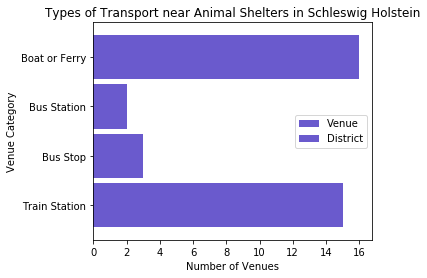

In [126]:
ax = SH_transportgroup.plot(kind='barh', figsize=(5, 4), color='slateblue', zorder=2, width=0.9)
ax.set_ylabel('Venue Category')
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Number of Venues')
ax.set_title('Types of Transport near Animal Shelters in Schleswig Holstein')

plt.show()

In [127]:
hamburg=ng_merged[ng_merged.State=='Hamburg']
hamburg.head()

,Tierheim,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,State,Address,District
11,Franziskus-Tierheim,53.597206,9.942069,H Hagenbeck,53.593635,9.943966,Bus Stop,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg
12,Franziskus-Tierheim,53.597206,9.942069,U Hagenbecks Tierpark,53.592912,9.944086,Metro Station,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg
13,Franziskus-Tierheim,53.597206,9.942069,U Hagendeel,53.603457,9.945201,Metro Station,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg
14,Franziskus-Tierheim,53.597206,9.942069,H Nedderfeld,53.603970,9.962550,Bus Stop,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg
15,Franziskus-Tierheim,53.597206,9.942069,H Langenfelder Damm,53.583184,9.933849,Bus Stop,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg


In [128]:
D2=hamburg[['Tierheim','State','Venue Category','District']]
D2new=D2.groupby(['Tierheim','State','District'])['Venue Category'].count()
D2totalnew=pd.DataFrame(D2new)
D2totalnew.head()

,,,Venue Category
Tierheim,State,District,
Franziskus-Tierheim,Hamburg,Hamburg,58
Hamburger Tierschutzverein von 1841,Hamburg,Hamburg,39


In [129]:
H_transportgroup = hamburg.groupby('Venue Category').count()
H_transportgroup.drop(['Tierheim', 'Latitude','Longitude','Venue Latitude','Venue Longitude','State','Address'], axis=1, inplace=True)
H_transportgroup

,Venue,District
Venue Category,,
Bus Station,4,4
Bus Stop,41,41
Light Rail Station,19,19
Metro Station,31,31
Train Station,2,2


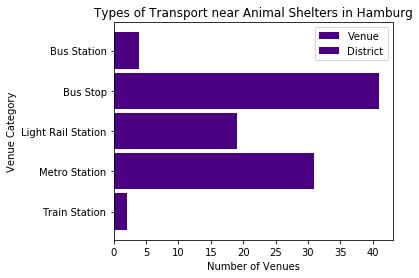

In [130]:
ax = H_transportgroup.plot(kind='barh', figsize=(5, 4), color='indigo', zorder=2, width=0.9)
ax.set_ylabel('Venue Category')
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Number of Venues')
ax.set_title('Types of Transport near Animal Shelters in Hamburg')

plt.show()

In [131]:
Bremen=ng_merged[ng_merged.State=='Bremen']
Bremen.head()

,Tierheim,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,State,Address,District
148,Bremer Tierschutzverein e.V.,53.113618,8.819876,Alexander von Humboldt,53.074823,8.803499,Boat or Ferry,Bremen,"(Tierheim Bremen, 491, Hemmstraße, In den Hufe...",Bremen
149,Bremer Tierschutzverein e.V.,53.113618,8.819876,Bremen Hauptbahnhof,53.083079,8.813784,Train Station,Bremen,"(Tierheim Bremen, 491, Hemmstraße, In den Hufe...",Bremen
150,Bremer Tierschutzverein e.V.,53.113618,8.819876,H Universität / Zentralbereich,53.107685,8.852522,Tram Station,Bremen,"(Tierheim Bremen, 491, Hemmstraße, In den Hufe...",Bremen
151,Bremer Tierschutzverein e.V.,53.113618,8.819876,H Kulenkampfallee,53.098431,8.839803,Tram Station,Bremen,"(Tierheim Bremen, 491, Hemmstraße, In den Hufe...",Bremen
152,Bremer Tierschutzverein e.V.,53.113618,8.819876,Bahnhof Bremen-Walle,53.103685,8.786255,Train Station,Bremen,"(Tierheim Bremen, 491, Hemmstraße, In den Hufe...",Bremen


In [132]:
D3=Bremen[['Tierheim','State','Venue Category','District']]
D3new=D3.groupby(['Tierheim','State','District'])['Venue Category'].count()
D3totalnew=pd.DataFrame(D3new)
D3totalnew.head()

,,,Venue Category
Tierheim,State,District,
Bremer Tierschutzverein e.V.,Bremen,Bremen,55


In [133]:
B_transportgroup = Bremen.groupby('Venue Category').count()
B_transportgroup.drop(['Tierheim', 'Latitude','Longitude','Venue Latitude','Venue Longitude','State','Address'], axis=1, inplace=True)
B_transportgroup

,Venue,District
Venue Category,,
Boat or Ferry,4,4
Bus Station,3,3
Bus Stop,12,12
Train Station,3,3
Tram Station,33,33


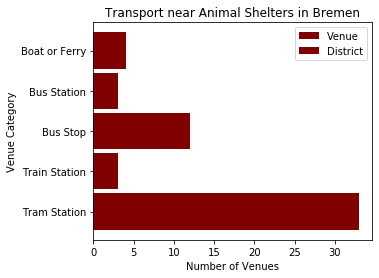

In [134]:
ax = B_transportgroup.plot(kind='barh', figsize=(5, 4), color='maroon', zorder=2, width=0.9)
ax.set_ylabel('Venue Category')
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Number of Venues')
ax.set_title('Transport near Animal Shelters in Bremen')

plt.show()

In [135]:
Pomerania=ng_merged[ng_merged.State=='Mecklenburg-Vorpommern']
Pomerania.head()

,Tierheim,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,State,Address,District
224,Tierheim Rostock Laage,53.934620,12.364206,S Laage (Meckl),53.919886,12.339690,Light Rail Station,Mecklenburg-Vorpommern,"(Pinnower Chaussee, Auf den Fußstücken, Pinnow...",Rostock
225,Tierheim Rostock Laage,53.934620,12.364206,S Kronskamp,53.933525,12.315646,Light Rail Station,Mecklenburg-Vorpommern,"(Pinnower Chaussee, Auf den Fußstücken, Pinnow...",Rostock
226,Tierheim Dorf Mecklenburg,53.862221,11.510797,Bahnhof Dorf Mecklenburg,53.832351,11.464084,Train Station,Mecklenburg-Vorpommern,"(L 102, Triwalk, Lübow, Dorf Mecklenburg-Bad K...",Nordwestmecklenburg
227,Tierheim Dorf Mecklenburg,53.862221,11.510797,Bahnhof Wismar,53.896408,11.469092,Train Station,Mecklenburg-Vorpommern,"(L 102, Triwalk, Lübow, Dorf Mecklenburg-Bad K...",Nordwestmecklenburg
228,Tierheim Dorf Mecklenburg,53.862221,11.510797,FlixBus Haltestelle,53.897236,11.465741,Bus Stop,Mecklenburg-Vorpommern,"(L 102, Triwalk, Lübow, Dorf Mecklenburg-Bad K...",Nordwestmecklenburg


In [136]:
D4=Pomerania[['Tierheim','State','Venue Category','District']]
D4new=D4.groupby(['Tierheim','State','District'])['Venue Category'].count()
D4totalnew=pd.DataFrame(D4new)
D4totalnew.head()

,,,Venue Category
Tierheim,State,District,
Tierheim Dorf Mecklenburg,Mecklenburg-Vorpommern,Nordwestmecklenburg,4
Tierheim Rostock Laage,Mecklenburg-Vorpommern,Rostock,2


In [137]:
MV_transportgroup = Pomerania.groupby('Venue Category').count()
MV_transportgroup.drop(['Tierheim', 'Latitude','Longitude','Venue Latitude','Venue Longitude','State','Address'], axis=1, inplace=True)
MV_transportgroup

,Venue,District
Venue Category,,
Bus Stop,1,1
Light Rail Station,2,2
Train Station,3,3


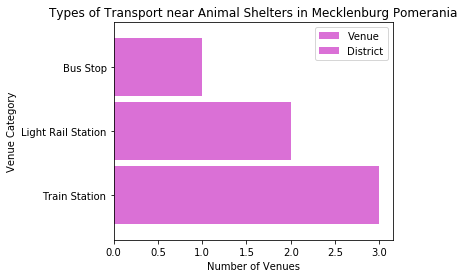

In [138]:
ax = MV_transportgroup.plot(kind='barh', figsize=(5, 4), color='orchid', zorder=2, width=0.9)
ax.set_ylabel('Venue Category')
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Number of Venues')
ax.set_title('Types of Transport near Animal Shelters in Mecklenburg Pomerania')

plt.show()

In [139]:
LS=ng_merged[ng_merged.State=='Niedersachsen']
LS.head()

,Tierheim,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,State,Address,District
128,Tierheim Tierschutz Nienburg „Drakenburger Hei...,52.683813,9.253760,Bahnhof Nienburg (Weser),52.644975,9.217543,Train Station,Niedersachsen,"(Tierheim Drakenburger Heide, Schipse, Drakenb...",Nienburg
129,Tierheim Arche-Noah,53.020377,8.788493,Brinkum ZOB,53.011885,8.789415,Bus Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz
130,Tierheim Arche-Noah,53.020377,8.788493,Ochtum Park,53.028178,8.807589,Bus Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz
131,Tierheim Arche-Noah,53.020377,8.788493,(H) Klinikum Links der Weser,53.037467,8.822446,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz
132,Tierheim Arche-Noah,53.020377,8.788493,H Flughafen Süd,53.050449,8.790177,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz


In [140]:
D5=LS[['Tierheim','State','Venue Category','District']]
D5new=D5.groupby(['Tierheim','State','District'])['Venue Category'].count()
D5totalnew=pd.DataFrame(D5new)
D5totalnew.head()

,,,Venue Category
Tierheim,State,District,
Tierheim Arche-Noah,Niedersachsen,Diepholz,19
Tierheim Lingen,Niedersachsen,Emsland,1
Tierheim Lüneburg,Niedersachsen,Osnabrück,7
Tierheim Tierschutz Nienburg „Drakenburger Heide“ e.V.,Niedersachsen,Nienburg,1
Tierheim Verden,Niedersachsen,Verden,1


In [141]:
LS_transportgroup = LS.groupby('Venue Category').count()
LS_transportgroup.drop(['Tierheim', 'Latitude','Longitude','Venue Latitude','Venue Longitude','State','Address'], axis=1, inplace=True)
LS_transportgroup

,Venue,District
Venue Category,,
Boat or Ferry,2,2
Bus Station,3,3
Bus Stop,12,12
Train Station,8,8
Tram Station,14,14


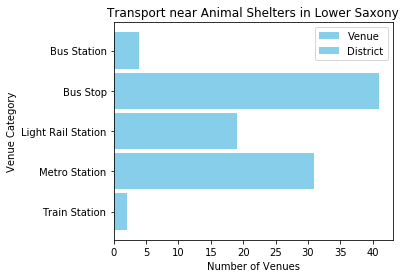

In [142]:
ax = H_transportgroup.plot(kind='barh', figsize=(5, 4), color='skyblue', zorder=2, width=0.9)
ax.set_ylabel('Venue Category')
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Number of Venues')
ax.set_title('Transport near Animal Shelters in Lower Saxony')

plt.show()

> ### Using Haversine Formula to calculate distance

In [68]:
from sklearn.neighbors import DistanceMetric
from math import radians

In [69]:
def haversine_vectorize(lon1, lat1, lon2, lat2):

    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    newlon = lon2 - lon1
    newlat = lat2 - lat1

    haver_formula = np.sin(newlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(newlon/2.0)**2

    dist = 2 * np.arcsin(np.sqrt(haver_formula ))
    km = 6367 * dist #6367 for distance in KM for miles use 3958
    return km

In [143]:
haversine_vectorize(ng_merged['Latitude'],ng_merged['Longitude'],ng_merged['Venue Latitude'],
                   ng_merged['Venue Longitude'])

0      3.183395
1      4.058135
2      5.364117
3      5.627548
4      7.274637
5      7.546796
6      5.268354
7      3.678257
8      2.395921
9      5.778264
10     1.811996
11     0.444125
12     0.520743
13     0.767646
14     2.393350
15     1.786096
16     2.159986
17     2.706873
18     1.827575
19     2.304855
20     3.257064
21     3.888390
22     3.851949
23     2.547612
24     2.663216
25     2.665953
26     4.304764
27     3.071059
28     3.251682
29     4.750457
30     4.349472
31     5.008651
32     3.281653
33     5.462777
34     5.484857
35     5.442119
36     4.123464
37     3.780049
38     5.877381
39     6.002764
40     4.904287
41     3.684735
42     4.724478
43     4.471334
44     3.965778
45     6.404222
46     3.923263
47     3.949853
48     6.612342
49     4.474908
50     4.504765
51     4.662792
52     4.202832
53     4.401196
54     5.885660
55     6.032884
56     5.403443
57     4.307543
58     4.480595
59     7.059301
60     6.254448
61     6.648806
62     4

In [144]:
ng_merged['haversine_dist'] = haversine_vectorize(ng_merged['Latitude'],ng_merged['Longitude'],ng_merged['Venue Latitude'],
                   ng_merged['Venue Longitude'])
ng_merged

,Tierheim,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,State,Address,District,haversine_dist
0,Tierheim Wasbek,54.084940,9.933420,Bahnhof Neumünster Stadtwald,54.083361,9.962025,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,3.183395
1,Tierheim Wasbek,54.084940,9.933420,Bahnhof Wasbek,54.075595,9.898081,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,4.058135
2,Tierheim Wasbek,54.084940,9.933420,ZOB Neumünster,54.075989,9.980879,Bus Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,5.364117
3,Tierheim Wasbek,54.084940,9.933420,Deutsche Bahn Werk Neumünster,54.082166,9.983988,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,5.627548
4,Tierheim Wasbek,54.084940,9.933420,H Ringstraße,54.070315,9.997279,Bus Stop,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,7.274637
5,Tierheim Wasbek,54.084940,9.933420,Bahnhof Neumünster Süd,54.060242,9.996826,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,7.546796
6,Tierheim Wasbek,54.084940,9.933420,Bahnhof Neumünster,54.075660,9.979940,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,5.268354
7,Tierheim Elmshorn,53.775885,9.655183,Bahnhof Horst (Holst),53.806550,9.641703,Train Station,Schleswig-Holstein,"(Bohn Segel, 6, Justus-von-Liebig-Straße, Indu...",Pinneberg,3.678257
8,Tierheim Elmshorn,53.775885,9.655183,Bahnhof Elmshorn,53.754433,9.659380,Train Station,Schleswig-Holstein,"(Bohn Segel, 6, Justus-von-Liebig-Straße, Indu...",Pinneberg,2.395921
9,Tierheim Eutin,54.148230,10.599702,Bahnhof Bad Malente-Gremsmühlen,54.167155,10.551146,Train Station,Schleswig-Holstein,"(Tierschutz Eutin und Umgebung e.V., 5, Diekst...",Ostholstein,5.778264


> ## Analysis <a name="analysis"></a>

>> ### Exploring the transportation facilities nearby the Animal Shelters

In [154]:

# one hot encoding of the venues' category names
ng_onehot = pd.get_dummies(ng_merged[['Venue Category']], prefix="", prefix_sep="")
# add column back to dataframe
ng_onehot['State'] = ng_merged['State'] 

# move column to the first column
fixed_columns = [ng_onehot.columns[-1]] + list(ng_onehot.columns[:-1])
ng_onehot = ng_onehot[fixed_columns]

ng_onehot.head()

,State,Boat or Ferry,Bus Station,Bus Stop,Light Rail Station,Metro Station,Train Station,Tram Station
0,Schleswig-Holstein,0,0,0,0,0,1,0
1,Schleswig-Holstein,0,0,0,0,0,1,0
2,Schleswig-Holstein,0,1,0,0,0,0,0
3,Schleswig-Holstein,0,0,0,0,0,1,0
4,Schleswig-Holstein,0,0,1,0,0,0,0


In [155]:
# Group rows by animal shelter name and by taking the mean of the frequency of occurrence of each category
ng_venues_grouped = ng_onehot.groupby('State').mean().reset_index()
ng_venues_grouped

,State,Boat or Ferry,Bus Station,Bus Stop,Light Rail Station,Metro Station,Train Station,Tram Station
0,Brandenburg,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
1,Bremen,0.072727,0.054545,0.218182,0.000000,0.000000,0.054545,0.600000
2,Hamburg,0.000000,0.041237,0.422680,0.195876,0.319588,0.020619,0.000000
3,Mecklenburg-Vorpommern,0.000000,0.000000,0.166667,0.333333,0.000000,0.500000,0.000000
4,Niedersachsen,0.051282,0.076923,0.307692,0.000000,0.000000,0.205128,0.358974
5,Schleswig-Holstein,0.444444,0.055556,0.083333,0.000000,0.000000,0.416667,0.000000


> ### K-means clustering 

In cluster analysis, the '**elbow method**' is a heuristic used in determining the number of clusters in a data set. The method consists of plotting the explained variation as a function of the number of clusters, and picking the elbow of the curve as the number of clusters to use. The same method can be used to choose the number of parameters in other data-driven models, such as the number of principal components to describe a data set.

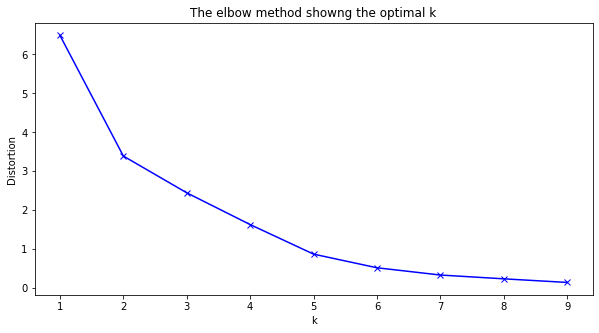

In [94]:

distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(transpo_cluster)
    distortions.append(kmeanModel.inertia_)
    
plt.figure(figsize=(10,5))
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The elbow method showng the optimal k')
plt.plot(K, distortions, 'bx-')
plt.show()

In [147]:
def return_most_common_venues(row, number_top_venues):
    row_categories=row.iloc[1:]
    row_categories_sorted=row_categories.sort_values(ascending=False)
    return row_categories_sorted.index.values[0:num_top_venue]

In [156]:
num_top_venue=7
indicators=['st','nd','rd']
# Creating columns according to number of top venues
columns=['State']
for ind in np.arange(num_top_venue):
    try:
        columns.append('{}{} Most common Venues'.format(ind+1,indicators[ind]))
    except:
        columns.append('{}th Most Common Venue.'.format(ind+1))
   
 # creating a new dataframe
tierheim_venues_sorted=pd.DataFrame(columns=columns)   
tierheim_venues_sorted['State']=ng_venues_grouped['State']

for ind in np.arange(ng_venues_grouped.shape[0]):
    tierheim_venues_sorted.iloc[ind,1:]=return_most_common_venues(ng_venues_grouped.iloc[ind,:],num_top_venue)
    
tierheim_venues_sorted.head(10)

,State,1st Most common Venues,2nd Most common Venues,3rd Most common Venues,4th Most Common Venue.,5th Most Common Venue.,6th Most Common Venue.,7th Most Common Venue.
0,Brandenburg,Train Station,Tram Station,Metro Station,Light Rail Station,Bus Stop,Bus Station,Boat or Ferry
1,Bremen,Tram Station,Bus Stop,Boat or Ferry,Train Station,Bus Station,Metro Station,Light Rail Station
2,Hamburg,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
3,Mecklenburg-Vorpommern,Train Station,Light Rail Station,Bus Stop,Tram Station,Metro Station,Bus Station,Boat or Ferry
4,Niedersachsen,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
5,Schleswig-Holstein,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station


In [157]:
kclusters = 5

transpo_cluster=ng_venues_grouped.drop('State',1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(transpo_cluster)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([2, 0, 3, 4, 0, 1])

In [158]:
# add clustering labels
tierheim_venues_sorted.insert(0,'Cluster Labels',kmeans.labels_)
newmerge=ng_merged
newmerge=newmerge.join(tierheim_venues_sorted.set_index('State'), on='State')
newmerge


,Tierheim,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,State,Address,District,haversine_dist,Cluster Labels,1st Most common Venues,2nd Most common Venues,3rd Most common Venues,4th Most Common Venue.,5th Most Common Venue.,6th Most Common Venue.,7th Most Common Venue.
0,Tierheim Wasbek,54.084940,9.933420,Bahnhof Neumünster Stadtwald,54.083361,9.962025,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,3.183395,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
1,Tierheim Wasbek,54.084940,9.933420,Bahnhof Wasbek,54.075595,9.898081,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,4.058135,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
2,Tierheim Wasbek,54.084940,9.933420,ZOB Neumünster,54.075989,9.980879,Bus Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,5.364117,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
3,Tierheim Wasbek,54.084940,9.933420,Deutsche Bahn Werk Neumünster,54.082166,9.983988,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,5.627548,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
4,Tierheim Wasbek,54.084940,9.933420,H Ringstraße,54.070315,9.997279,Bus Stop,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,7.274637,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
5,Tierheim Wasbek,54.084940,9.933420,Bahnhof Neumünster Süd,54.060242,9.996826,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,7.546796,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
6,Tierheim Wasbek,54.084940,9.933420,Bahnhof Neumünster,54.075660,9.979940,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,5.268354,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
7,Tierheim Elmshorn,53.775885,9.655183,Bahnhof Horst (Holst),53.806550,9.641703,Train Station,Schleswig-Holstein,"(Bohn Segel, 6, Justus-von-Liebig-Straße, Indu...",Pinneberg,3.678257,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
8,Tierheim Elmshorn,53.775885,9.655183,Bahnhof Elmshorn,53.754433,9.659380,Train Station,Schleswig-Holstein,"(Bohn Segel, 6, Justus-von-Liebig-Straße, Indu...",Pinneberg,2.395921,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
9,Tierheim Eutin,54.148230,10.599702,Bahnhof Bad Malente-Gremsmühlen,54.167155,10.551146,Train Station,Schleswig-Holstein,"(Tierschutz Eutin und Umgebung e.V., 5, Diekst...",Ostholstein,5.778264,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station


In [159]:
map_clusters = DE_geo

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(newmerge['Venue Latitude'], newmerge['Venue Longitude'], newmerge['Tierheim'], newmerge['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [160]:
newmerge.loc[newmerge['Cluster Labels'] == 0, newmerge.columns[[0] + list(range(5, newmerge.shape[1]))]]

,Tierheim,Venue Longitude,Venue Category,State,Address,District,haversine_dist,Cluster Labels,1st Most common Venues,2nd Most common Venues,3rd Most common Venues,4th Most Common Venue.,5th Most Common Venue.,6th Most Common Venue.,7th Most Common Venue.
128,Tierheim Tierschutz Nienburg „Drakenburger Hei...,9.217543,Train Station,Niedersachsen,"(Tierheim Drakenburger Heide, Schipse, Drakenb...",Nienburg,5.860407,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
129,Tierheim Arche-Noah,8.789415,Bus Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,0.938199,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
130,Tierheim Arche-Noah,8.807589,Bus Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,2.288460,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
131,Tierheim Arche-Noah,8.822446,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,4.214047,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
132,Tierheim Arche-Noah,8.790177,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,3.307808,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
133,Tierheim Arche-Noah,8.824194,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,4.629984,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
134,Tierheim Arche-Noah,8.838417,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,5.699479,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
135,Tierheim Arche-Noah,8.820687,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,4.742361,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
136,Tierheim Arche-Noah,8.784011,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,3.996036,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
137,Tierheim Arche-Noah,8.784320,Bus Stop,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,3.999252,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station


> ### Exploring the Clusters

In [166]:
newmerge.loc[newmerge['Cluster Labels'] == 0, newmerge.columns[[0] + list(range(5, newmerge.shape[1]))]]

,Tierheim,Venue Longitude,Venue Category,State,Address,District,haversine_dist,Cluster Labels,1st Most common Venues,2nd Most common Venues,3rd Most common Venues,4th Most Common Venue.,5th Most Common Venue.,6th Most Common Venue.,7th Most Common Venue.
128,Tierheim Tierschutz Nienburg „Drakenburger Hei...,9.217543,Train Station,Niedersachsen,"(Tierheim Drakenburger Heide, Schipse, Drakenb...",Nienburg,5.860407,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
129,Tierheim Arche-Noah,8.789415,Bus Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,0.938199,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
130,Tierheim Arche-Noah,8.807589,Bus Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,2.288460,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
131,Tierheim Arche-Noah,8.822446,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,4.214047,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
132,Tierheim Arche-Noah,8.790177,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,3.307808,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
133,Tierheim Arche-Noah,8.824194,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,4.629984,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
134,Tierheim Arche-Noah,8.838417,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,5.699479,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
135,Tierheim Arche-Noah,8.820687,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,4.742361,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
136,Tierheim Arche-Noah,8.784011,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,3.996036,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
137,Tierheim Arche-Noah,8.784320,Bus Stop,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,3.999252,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station


> **Cluster 0** 

    1. Comprised of 7 Districts, Emsland, Osnabrück, Verden, Bremen, Diepholz, Lüneberg and Nienburg
    2. Foursquare returned 4 similar transportation categories for each district namely: Train Station, Bus Stop, Boat or Ferry,and Tram Station.
    3. Out of all these categories, the cluster's main similarities is derived from the list of " Most common venues". As you may notice, the districts above have the same top 3 rankings for the "most common venues"

In [161]:
newmerge.loc[newmerge['Cluster Labels'] == 1, newmerge.columns[[1] + list(range(5, newmerge.shape[1]))]]

,Latitude,Venue Longitude,Venue Category,State,Address,District,haversine_dist,Cluster Labels,1st Most common Venues,2nd Most common Venues,3rd Most common Venues,4th Most Common Venue.,5th Most Common Venue.,6th Most Common Venue.,7th Most Common Venue.
0,54.084940,9.962025,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,3.183395,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
1,54.084940,9.898081,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,4.058135,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
2,54.084940,9.980879,Bus Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,5.364117,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
3,54.084940,9.983988,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,5.627548,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
4,54.084940,9.997279,Bus Stop,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,7.274637,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
5,54.084940,9.996826,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,7.546796,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
6,54.084940,9.979940,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,5.268354,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
7,53.775885,9.641703,Train Station,Schleswig-Holstein,"(Bohn Segel, 6, Justus-von-Liebig-Straße, Indu...",Pinneberg,3.678257,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
8,53.775885,9.659380,Train Station,Schleswig-Holstein,"(Bohn Segel, 6, Justus-von-Liebig-Straße, Indu...",Pinneberg,2.395921,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
9,54.148230,10.551146,Train Station,Schleswig-Holstein,"(Tierschutz Eutin und Umgebung e.V., 5, Diekst...",Ostholstein,5.778264,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station


> **Cluster 1**   

    1. Comprised of 5 Districts: Nordfriesland, Minden-Lübecke, Lübeck, Ostholstein, Pinneberg, and Rendsburg-Eckernförde.   
    2. Foursquare returned 4 similar transportation categories for each district namely: Train Station, Bus Stop, Boat or Ferry, Bus Station.
    3. Out of all these categories, the cluster's main similarities is derived from the list of " Most common venues". As you may notice, the districts above have the same top 3 rankings for the "most common venues"

In [162]:
newmerge.loc[newmerge['Cluster Labels'] == 2, newmerge.columns[[2] + list(range(5, newmerge.shape[1]))]]

,Longitude,Venue Longitude,Venue Category,State,Address,District,haversine_dist,Cluster Labels,1st Most common Venues,2nd Most common Venues,3rd Most common Venues,4th Most Common Venue.,5th Most Common Venue.,6th Most Common Venue.,7th Most Common Venue.
230,11.906967,11.949106,Train Station,Brandenburg,"(Tierheim & Tierpension, 13, Abbau Lanken, Gro...",Bad Wilsnack,4.711136,2,Train Station,Tram Station,Metro Station,Light Rail Station,Bus Stop,Bus Station,Boat or Ferry


In [163]:
newmerge.loc[newmerge['Cluster Labels'] == 3, newmerge.columns[[3] + list(range(5, newmerge.shape[1]))]]

,Venue,Venue Longitude,Venue Category,State,Address,District,haversine_dist,Cluster Labels,1st Most common Venues,2nd Most common Venues,3rd Most common Venues,4th Most Common Venue.,5th Most Common Venue.,6th Most Common Venue.,7th Most Common Venue.
11,H Hagenbeck,9.943966,Bus Stop,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg,0.444125,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
12,U Hagenbecks Tierpark,9.944086,Metro Station,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg,0.520743,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
13,U Hagendeel,9.945201,Metro Station,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg,0.767646,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
14,H Nedderfeld,9.962550,Bus Stop,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg,2.393350,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
15,H Langenfelder Damm,9.933849,Bus Stop,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg,1.786096,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
16,H Niendorfer Gehege,9.926839,Bus Stop,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg,2.159986,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
17,S Stellingen,9.918787,Light Rail Station,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg,2.706873,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
18,U Lutterothstraße,9.948192,Metro Station,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg,1.827575,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
19,S Langenfelde,9.930884,Light Rail Station,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg,2.304855,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
20,H Gärtnerstraße,9.968904,Bus Stop,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg,3.257064,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry


> **Cluster 3**   

    1. Comprised of only one District:Hamburg.
    2. Foursquare returned 5 similar transportation categories for each district namely: Train Station, Bus Stop, Metro Station, Bus Station, Light rail station.
    3. Out of all these categories, the cluster's main similarities is derived from the list of " Most common venues". As you may notice, the districts above have the same top 3 rankings for the "most common venues"

In [164]:
newmerge.loc[newmerge['Cluster Labels'] == 4, newmerge.columns[[4] + list(range(5, newmerge.shape[1]))]]

,Venue Latitude,Venue Longitude,Venue Category,State,Address,District,haversine_dist,Cluster Labels,1st Most common Venues,2nd Most common Venues,3rd Most common Venues,4th Most Common Venue.,5th Most Common Venue.,6th Most Common Venue.,7th Most Common Venue.
224,53.919886,12.339690,Light Rail Station,Mecklenburg-Vorpommern,"(Pinnower Chaussee, Auf den Fußstücken, Pinnow...",Rostock,3.159178,4,Train Station,Light Rail Station,Bus Stop,Tram Station,Metro Station,Bus Station,Boat or Ferry
225,53.933525,12.315646,Light Rail Station,Mecklenburg-Vorpommern,"(Pinnower Chaussee, Auf den Fußstücken, Pinnow...",Rostock,5.397545,4,Train Station,Light Rail Station,Bus Stop,Tram Station,Metro Station,Bus Station,Boat or Ferry
226,53.832351,11.464084,Train Station,Mecklenburg-Vorpommern,"(L 102, Triwalk, Lübow, Dorf Mecklenburg-Bad K...",Nordwestmecklenburg,6.125947,4,Train Station,Light Rail Station,Bus Stop,Tram Station,Metro Station,Bus Station,Boat or Ferry
227,53.896408,11.469092,Train Station,Mecklenburg-Vorpommern,"(L 102, Triwalk, Lübow, Dorf Mecklenburg-Bad K...",Nordwestmecklenburg,5.944616,4,Train Station,Light Rail Station,Bus Stop,Tram Station,Metro Station,Bus Station,Boat or Ferry
228,53.897236,11.465741,Bus Stop,Mecklenburg-Vorpommern,"(L 102, Triwalk, Lübow, Dorf Mecklenburg-Bad K...",Nordwestmecklenburg,6.293539,4,Train Station,Light Rail Station,Bus Stop,Tram Station,Metro Station,Bus Station,Boat or Ferry
229,53.822392,11.476415,Train Station,Mecklenburg-Vorpommern,"(L 102, Triwalk, Lübow, Dorf Mecklenburg-Bad K...",Nordwestmecklenburg,5.780094,4,Train Station,Light Rail Station,Bus Stop,Tram Station,Metro Station,Bus Station,Boat or Ferry


> **Cluster 4**   

    1. Comprised of only one District:Mecklenburg-Vorpommern.
    2. Foursquare returned 3 similar transportation categories for each district namely: Train Station, Bus Stop, Light rail station.
    3. Out of all these categories, the cluster's main similarities is derived from the list of " Most common venues". As you may notice, the districts above have the same top 3 rankings for the "most common venues"

In [222]:
hamburgtranspo=newmerge[newmerge.District=='Hamburg']
hamburgtranspo.sort_values(['haversine_dist'], axis=0, ascending=True, inplace=True)
hamburgtranspo1=hamburgtranspo.reset_index()
hamburgtranspo1

C:\Users\Mercurial\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,index,Tierheim,Latitude,Longitude,Venue,VenueLatitude,VenueLongitude,Venuecategory,State,Address,District,haversine_dist,CLuster,1stMostCommonVenue,2ndMostCommonVenue,3rdMostCommonVenue,4thMostCommonVenue,5thMostCommonVenue,6thMostCommonVenue,7thMostCommonVenue
0,11,Franziskus-Tierheim,53.597206,9.942069,H Hagenbeck,53.593635,9.943966,Bus Stop,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg,0.444125,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
1,12,Franziskus-Tierheim,53.597206,9.942069,U Hagenbecks Tierpark,53.592912,9.944086,Metro Station,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg,0.520743,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
2,13,Franziskus-Tierheim,53.597206,9.942069,U Hagendeel,53.603457,9.945201,Metro Station,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg,0.767646,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
3,91,Hamburger Tierschutzverein von 1841,53.546099,10.066138,U Rauhes Haus,53.554191,10.066030,Metro Station,Hamburg,"(Tierheim Süderstraße, Schurzallee-Mitte, Hamm...",Hamburg,0.885557,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
4,92,Hamburger Tierschutzverein von 1841,53.546099,10.066138,U Hammer Kirche,53.555570,10.055076,Metro Station,Hamburg,"(Tierheim Süderstraße, Schurzallee-Mitte, Hamm...",Hamburg,1.607826,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
5,95,Hamburger Tierschutzverein von 1841,53.546099,10.066138,S Tiefstack,53.531183,10.065767,Light Rail Station,Hamburg,"(Tierheim Süderstraße, Schurzallee-Mitte, Hamm...",Hamburg,1.632450,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
6,15,Franziskus-Tierheim,53.597206,9.942069,H Langenfelder Damm,53.583184,9.933849,Bus Stop,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg,1.786096,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
7,18,Franziskus-Tierheim,53.597206,9.942069,U Lutterothstraße,53.581710,9.948192,Metro Station,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg,1.827575,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
8,16,Franziskus-Tierheim,53.597206,9.942069,H Niendorfer Gehege,53.609469,9.926839,Bus Stop,Hamburg,"(Franziskustierheim, 7, Lokstedter Grenzstraße...",Hamburg,2.159986,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry
9,93,Hamburger Tierschutzverein von 1841,53.546099,10.066138,U Horner Rennbahn,53.553926,10.084522,Metro Station,Hamburg,"(Tierheim Süderstraße, Schurzallee-Mitte, Hamm...",Hamburg,2.215173,3,Bus Stop,Metro Station,Light Rail Station,Bus Station,Train Station,Tram Station,Boat or Ferry


In [223]:
headers=["Tierheim","Latitude","Longitude","Venue","VenueLatitude","VenueLongitude","Venuecategory","State","Address","District","haversine_dist", "CLuster","1stMostCommonVenue","2ndMostCommonVenue","3rdMostCommonVenue","4thMostCommonVenue","5thMostCommonVenue","6thMostCommonVenue","7thMostCommonVenue"]
newmerge.columns=headers
newmerge.head()

,Tierheim,Latitude,Longitude,Venue,VenueLatitude,VenueLongitude,Venuecategory,State,Address,District,haversine_dist,CLuster,1stMostCommonVenue,2ndMostCommonVenue,3rdMostCommonVenue,4thMostCommonVenue,5thMostCommonVenue,6thMostCommonVenue,7thMostCommonVenue
0,Tierheim Wasbek,54.08494,9.93342,Bahnhof Neumünster Stadtwald,54.083361,9.962025,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,3.183395,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
1,Tierheim Wasbek,54.08494,9.93342,Bahnhof Wasbek,54.075595,9.898081,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,4.058135,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
2,Tierheim Wasbek,54.08494,9.93342,ZOB Neumünster,54.075989,9.980879,Bus Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,5.364117,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
3,Tierheim Wasbek,54.08494,9.93342,Deutsche Bahn Werk Neumünster,54.082166,9.983988,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,5.627548,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
4,Tierheim Wasbek,54.08494,9.93342,H Ringstraße,54.070315,9.997279,Bus Stop,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,7.274637,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station


In [207]:
pop1 = folium.map.FeatureGroup()

for lat, lng, in zip(hamburgtranspo1.VenueLatitude, hamburgtranspo1.VenueLongitude):
    pop1.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='red',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# add pop-up text to each marker on the map
latitudes = list(hamburgtranspo1.VenueLatitude)
longitudes = list(hamburgtranspo1.VenueLongitude)
labels = list(hamburgtranspo1.Venue)

# add incidents to map
DE_geo.add_child(pop1)

In [229]:
Stranspo=newmerge[newmerge.State=="Schleswig-Holstein"]
Stranspo.sort_values(['haversine_dist'], axis=0, ascending=True, inplace=False)
Stranspo1=Stranspo.reset_index()
Stranspo1

,index,Tierheim,Latitude,Longitude,Venue,VenueLatitude,VenueLongitude,Venuecategory,State,Address,District,haversine_dist,CLuster,1stMostCommonVenue,2ndMostCommonVenue,3rdMostCommonVenue,4thMostCommonVenue,5thMostCommonVenue,6thMostCommonVenue,7thMostCommonVenue
0,0,Tierheim Wasbek,54.084940,9.933420,Bahnhof Neumünster Stadtwald,54.083361,9.962025,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,3.183395,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
1,1,Tierheim Wasbek,54.084940,9.933420,Bahnhof Wasbek,54.075595,9.898081,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,4.058135,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
2,2,Tierheim Wasbek,54.084940,9.933420,ZOB Neumünster,54.075989,9.980879,Bus Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,5.364117,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
3,3,Tierheim Wasbek,54.084940,9.933420,Deutsche Bahn Werk Neumünster,54.082166,9.983988,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,5.627548,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
4,4,Tierheim Wasbek,54.084940,9.933420,H Ringstraße,54.070315,9.997279,Bus Stop,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,7.274637,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
5,5,Tierheim Wasbek,54.084940,9.933420,Bahnhof Neumünster Süd,54.060242,9.996826,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,7.546796,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
6,6,Tierheim Wasbek,54.084940,9.933420,Bahnhof Neumünster,54.075660,9.979940,Train Station,Schleswig-Holstein,"(111, Krusenhofer Weg, Wasbek, Rendsburg-Ecker...",Rendsburg-Eckernförde,5.268354,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
7,7,Tierheim Elmshorn,53.775885,9.655183,Bahnhof Horst (Holst),53.806550,9.641703,Train Station,Schleswig-Holstein,"(Bohn Segel, 6, Justus-von-Liebig-Straße, Indu...",Pinneberg,3.678257,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
8,8,Tierheim Elmshorn,53.775885,9.655183,Bahnhof Elmshorn,53.754433,9.659380,Train Station,Schleswig-Holstein,"(Bohn Segel, 6, Justus-von-Liebig-Straße, Indu...",Pinneberg,2.395921,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station
9,9,Tierheim Eutin,54.148230,10.599702,Bahnhof Bad Malente-Gremsmühlen,54.167155,10.551146,Train Station,Schleswig-Holstein,"(Tierschutz Eutin und Umgebung e.V., 5, Diekst...",Ostholstein,5.778264,1,Boat or Ferry,Train Station,Bus Stop,Bus Station,Tram Station,Metro Station,Light Rail Station


In [206]:
pop2 = folium.map.FeatureGroup()

for lat, lng, in zip(Stranspo.VenueLatitude, Stranspo.VenueLongitude):
    pop2.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='orange',
            fill=True,
            fill_color='red',
            fill_opacity=0.6
        )
    )

# add pop-up text to each marker on the map
latitudes = list(Stranspo.VenueLatitude)
longitudes = list(Stranspo.VenueLongitude)
labels = list(Stranspo.Venue)

# add incidents to map
DE_geo.add_child(pop2)

In [231]:
Ntranspo=newmerge[newmerge.State=="Niedersachsen"]
Ntranspo.sort_values(['haversine_dist'], axis=0, ascending=True, inplace=False)
Ntranspo1=Ntranspo.reset_index()
Ntranspo1

,index,Tierheim,Latitude,Longitude,Venue,VenueLatitude,VenueLongitude,Venuecategory,State,Address,District,haversine_dist,CLuster,1stMostCommonVenue,2ndMostCommonVenue,3rdMostCommonVenue,4thMostCommonVenue,5thMostCommonVenue,6thMostCommonVenue,7thMostCommonVenue
0,128,Tierheim Tierschutz Nienburg „Drakenburger Hei...,52.683813,9.253760,Bahnhof Nienburg (Weser),52.644975,9.217543,Train Station,Niedersachsen,"(Tierheim Drakenburger Heide, Schipse, Drakenb...",Nienburg,5.860407,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
1,129,Tierheim Arche-Noah,53.020377,8.788493,Brinkum ZOB,53.011885,8.789415,Bus Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,0.938199,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
2,130,Tierheim Arche-Noah,53.020377,8.788493,Ochtum Park,53.028178,8.807589,Bus Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,2.288460,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
3,131,Tierheim Arche-Noah,53.020377,8.788493,(H) Klinikum Links der Weser,53.037467,8.822446,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,4.214047,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
4,132,Tierheim Arche-Noah,53.020377,8.788493,H Flughafen Süd,53.050449,8.790177,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,3.307808,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
5,133,Tierheim Arche-Noah,53.020377,8.788493,H Robert-Koch-Str.,53.042113,8.824194,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,4.629984,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
6,134,Tierheim Arche-Noah,53.020377,8.788493,H Heukämpendamm,53.032272,8.838417,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,5.699479,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
7,135,Tierheim Arche-Noah,53.020377,8.788493,H Sielhof,53.048725,8.820687,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,4.742361,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
8,136,Tierheim Arche-Noah,53.020377,8.788493,H Neuenlander Kämpe,53.056480,8.784011,Tram Station,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,3.996036,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station
9,137,Tierheim Arche-Noah,53.020377,8.788493,H Neuenlander Kämpe,53.056548,8.784320,Bus Stop,Niedersachsen,"(Tierheim Arche Noah, 10, Rodendamm, Mitteldeu...",Diepholz,3.999252,0,Tram Station,Bus Stop,Train Station,Bus Station,Boat or Ferry,Metro Station,Light Rail Station


In [209]:
pop3 = folium.map.FeatureGroup()

for lat, lng, in zip(Ntranspo.VenueLatitude, Ntranspo.VenueLongitude):
    pop3.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='green',
            fill=True,
            fill_color='violet',
            fill_opacity=0.6
        )
    )

# add pop-up text to each marker on the map
latitudes = list(Ntranspo.VenueLatitude)
longitudes = list(Ntranspo.VenueLongitude)
labels = list(Ntranspo.Venue)

# add incidents to map
DE_geo.add_child(pop3)

In [232]:
Btranspo=newmerge[newmerge.State=="Bremen"]
Btranspo.sort_values(['haversine_dist'], axis=0, ascending=True, inplace=False)
Btranspo1=Btranspo.reset_index()
Btranspo1.head()

,index,Tierheim,Latitude,Longitude,Venue,VenueLatitude,VenueLongitude,Venuecategory,State,Address,District,haversine_dist,CLuster,1stMostCommonVenue,2ndMostCommonVenue,3rdMostCommonVenue,4thMostCommonVenue,5thMostCommonVenue,6thMostCommonVenue,7thMostCommonVenue
0,148,Bremer Tierschutzverein e.V.,53.113618,8.819876,Alexander von Humboldt,53.074823,8.803499,Boat or Ferry,Bremen,"(Tierheim Bremen, 491, Hemmstraße, In den Hufe...",Bremen,4.632669,0,Tram Station,Bus Stop,Boat or Ferry,Train Station,Bus Station,Metro Station,Light Rail Station
1,149,Bremer Tierschutzverein e.V.,53.113618,8.819876,Bremen Hauptbahnhof,53.083079,8.813784,Train Station,Bremen,"(Tierheim Bremen, 491, Hemmstraße, In den Hufe...",Bremen,3.421277,0,Tram Station,Bus Stop,Boat or Ferry,Train Station,Bus Station,Metro Station,Light Rail Station
2,150,Bremer Tierschutzverein e.V.,53.113618,8.819876,H Universität / Zentralbereich,53.107685,8.852522,Tram Station,Bremen,"(Tierheim Bremen, 491, Hemmstraße, In den Hufe...",Bremen,3.685849,0,Tram Station,Bus Stop,Boat or Ferry,Train Station,Bus Station,Metro Station,Light Rail Station
3,151,Bremer Tierschutzverein e.V.,53.113618,8.819876,H Kulenkampfallee,53.098431,8.839803,Tram Station,Bremen,"(Tierheim Bremen, 491, Hemmstraße, In den Hufe...",Bremen,2.772156,0,Tram Station,Bus Stop,Boat or Ferry,Train Station,Bus Station,Metro Station,Light Rail Station
4,152,Bremer Tierschutzverein e.V.,53.113618,8.819876,Bahnhof Bremen-Walle,53.103685,8.786255,Train Station,Bremen,"(Tierheim Bremen, 491, Hemmstraße, In den Hufe...",Bremen,3.892119,0,Tram Station,Bus Stop,Boat or Ferry,Train Station,Bus Station,Metro Station,Light Rail Station


In [216]:
pop4 = folium.map.FeatureGroup()

for lat, lng, in zip(Btranspo.VenueLatitude, Btranspo.VenueLongitude):
    pop4.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='violet',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# add pop-up text to each marker on the map
latitudes = list(Btranspo.VenueLatitude)
longitudes = list(Btranspo.VenueLongitude)
labels = list(Btranspo.Venue)

# add incidents to map
DE_geo.add_child(pop4)

In [233]:
Ptranspo=newmerge[newmerge.State=="Mecklenburg-Vorpommern"]
Ptranspo.sort_values(['haversine_dist'], axis=0, ascending=True, inplace=False)
Ptranspo1=Ptranspo.reset_index()
Ptranspo1.head()

,index,Tierheim,Latitude,Longitude,Venue,VenueLatitude,VenueLongitude,Venuecategory,State,Address,District,haversine_dist,CLuster,1stMostCommonVenue,2ndMostCommonVenue,3rdMostCommonVenue,4thMostCommonVenue,5thMostCommonVenue,6thMostCommonVenue,7thMostCommonVenue
0,224,Tierheim Rostock Laage,53.934620,12.364206,S Laage (Meckl),53.919886,12.339690,Light Rail Station,Mecklenburg-Vorpommern,"(Pinnower Chaussee, Auf den Fußstücken, Pinnow...",Rostock,3.159178,4,Train Station,Light Rail Station,Bus Stop,Tram Station,Metro Station,Bus Station,Boat or Ferry
1,225,Tierheim Rostock Laage,53.934620,12.364206,S Kronskamp,53.933525,12.315646,Light Rail Station,Mecklenburg-Vorpommern,"(Pinnower Chaussee, Auf den Fußstücken, Pinnow...",Rostock,5.397545,4,Train Station,Light Rail Station,Bus Stop,Tram Station,Metro Station,Bus Station,Boat or Ferry
2,226,Tierheim Dorf Mecklenburg,53.862221,11.510797,Bahnhof Dorf Mecklenburg,53.832351,11.464084,Train Station,Mecklenburg-Vorpommern,"(L 102, Triwalk, Lübow, Dorf Mecklenburg-Bad K...",Nordwestmecklenburg,6.125947,4,Train Station,Light Rail Station,Bus Stop,Tram Station,Metro Station,Bus Station,Boat or Ferry
3,227,Tierheim Dorf Mecklenburg,53.862221,11.510797,Bahnhof Wismar,53.896408,11.469092,Train Station,Mecklenburg-Vorpommern,"(L 102, Triwalk, Lübow, Dorf Mecklenburg-Bad K...",Nordwestmecklenburg,5.944616,4,Train Station,Light Rail Station,Bus Stop,Tram Station,Metro Station,Bus Station,Boat or Ferry
4,228,Tierheim Dorf Mecklenburg,53.862221,11.510797,FlixBus Haltestelle,53.897236,11.465741,Bus Stop,Mecklenburg-Vorpommern,"(L 102, Triwalk, Lübow, Dorf Mecklenburg-Bad K...",Nordwestmecklenburg,6.293539,4,Train Station,Light Rail Station,Bus Stop,Tram Station,Metro Station,Bus Station,Boat or Ferry


In [218]:
pop5 = folium.map.FeatureGroup()

for lat, lng, in zip(Ptranspo.VenueLatitude, Ptranspo.VenueLongitude):
    pop5.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='black',
            fill=True,
            fill_color='indigo',
            fill_opacity=0.6
        )
    )

# add pop-up text to each marker on the map
latitudes = list(Ptranspo.VenueLatitude)
longitudes = list(Ptranspo.VenueLongitude)
labels = list(Ptranspo.Venue)

# add incidents to map
DE_geo.add_child(pop5)

> ## Results and Discussion <a name="results"></a>

Our analysis shows that although our selected land Area is big, the  number of Animal Shelters yielded were only a few. The venues for these shelters are also not close to the city centers, most of them are in remote villages-most likely to be able to accomodate space and not to disturb residential areas. Being in remote areas will also help their animals to be more at rest.

Although there are a lot of transportation facilities availabale around the Animal Shelters, most of them are situated approxiamately around 1 km away from the Shelter. At most, one bus stop is ~300 meters from the Animal Shelter in Hamburg. Most of the Shelters are more accessible thru use of private vehicles. Train Stations are even further with approximates ~5km distance from each Shelter.

Interensingly, some Shelters can be accessed by Boat and Ferry. Most of which are located near the coast.

Recommended zones should therefore be considered only as a starting point for more detailed analysis which could eventually result in location which has not only no nearby competition but also other factors taken into account and all other relevant conditions met.

> ### Conclusion <a name="Conclusion"></a>

The purpose of this project was to identify areas in North germany with Animal Shelters close to transportation services and with a good population distribution in order to aid stakeholders in narrowing down the search for optimal location for a new Pet Cafe. By acquiring Animal Shelter venuesfrom Foursquare and the Population data from each District, we have identified the top Districts that justify further analysis 

We then generated extensive collection of transportation locations which satisfy some basic requirements regarding  nearby transporation services. Clustering of those locations was then performed in order to create areas of interest and addresses  were created to be used as starting points for final exploration by stakeholders.

